# Configurações Iniciais

    - Importando bibliotecas necessárias

In [1]:
import random
import os
import shutil

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from PIL import Image
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, confusion_matrix, precision_recall_fscore_support

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split

import torchvision
from torchvision import datasets
import torchvision.models as models
from torchvision.transforms import v2
import torchvision.transforms.functional as TF

    - Definindo a seed
    - Setando o device
    - Criando a função de mostrar imagens

In [2]:
def set_seed(seed=1234):
    random.seed(seed)
    os.environ['PYHTONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

set_seed()
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [3]:
def imshow(img):
    plt.figure(figsize=(20,8))
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

---

# Definindo o Dataset
    - Definindo as imagens
    - Realizando as transformações - tiramos a normalização de cor pois estava prejudicando
    - Dividindo entre treino e teste
    - Comparar imagens com normalização | sem normalização

In [4]:
img_size = (299,299)

transformations = v2.Compose([
    v2.Resize(img_size), 
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.RandomRotation(degrees=(0, 180)),
    v2.RandomPerspective(p=0.5),  v2.ToImage(), v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [5]:
dataset_dir = 'assets'
checkpoints_dir = ".ipynb_checkpoints"

if os.path.exists(checkpoints_dir):
    if os.path.isdir(checkpoints_dir):
        shutil.rmtree(checkpoints_dir)
    else:
        os.remove(checkpoints_dir)

dataset = datasets.ImageFolder(root=dataset_dir, transform=transformations)
print(os.listdir(dataset_dir))

['Carlos', 'Urien']


In [6]:
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

total_size = len(dataset)
train_size = int(train_ratio * total_size)
val_size = int(val_ratio * total_size)
test_size = total_size - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

print(f"Tamanho do conjunto de treino: {len(train_dataset)}")
print(f"Tamanho do conjunto de validação: {len(val_dataset)}")
print(f"Tamanho do conjunto de teste: {len(test_dataset)}")

Tamanho do conjunto de treino: 139
Tamanho do conjunto de validação: 29
Tamanho do conjunto de teste: 31


In [7]:
batch_size = 12

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Número de batches no conjunto de treino: {len(train_loader)}")
print(f"Número de batches no conjunto de validação: {len(val_loader)}")
print(f"Número de batches no conjunto de teste: {len(test_loader)}")

Número de batches no conjunto de treino: 12
Número de batches no conjunto de validação: 3
Número de batches no conjunto de teste: 3


C:\Users\Cliente\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\transforms\v2\_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


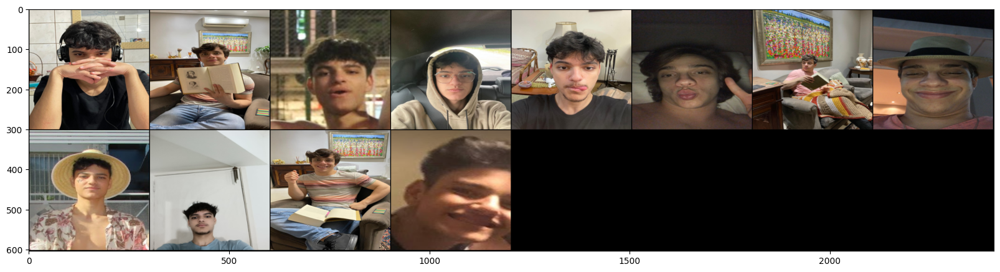

In [8]:
# SEM NORMALIZAÇÃO E TRANSFORMAÇÕES

no_transformations = v2.Compose([v2.Resize(img_size), v2.ToTensor()])
dataset_nt = datasets.ImageFolder(root=dataset_dir, transform=no_transformations)
nt_loader = DataLoader(dataset_nt,batch_size=batch_size, shuffle=True)

dataiter_nt = iter(nt_loader)
images_nt = next(dataiter_nt)
imshow(torchvision.utils.make_grid(images_nt[0]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


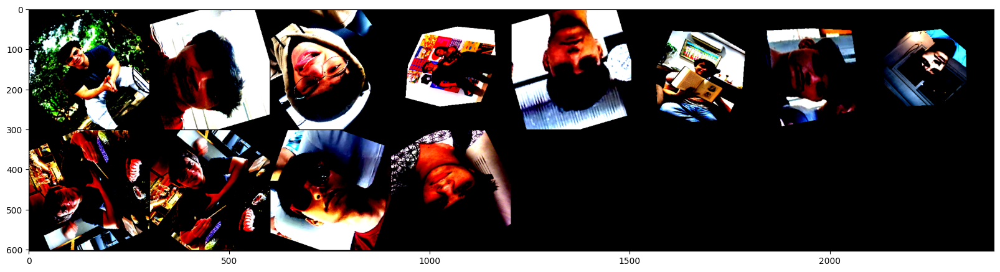

In [9]:
# COM NORMALIZAÇÃO E TRANSFORMAÇÕES

dataiter = iter(train_loader)
images = next(dataiter)
imshow(torchvision.utils.make_grid(images[0]))

---

# Definindo Funções

    - Comparação entre Loss de treino e validação
    - Validação
    - Treino
    - Métricas de Avaliação

In [10]:
def plot_comparison(train_losses, val_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training e Validation Loss')
    plt.legend()
    plt.show()

In [11]:
def plot_equation(train_losses, val_losses):
    epochs = np.arange(len(train_losses))
    
    train_fit = np.polyfit(epochs, train_losses, 3)
    train_fit_fn = np.poly1d(train_fit)
    
    val_fit = np.polyfit(epochs, val_losses, 3)
    val_fit_fn = np.poly1d(val_fit)
    
    plt.plot(epochs, train_fit_fn(epochs), color='blue', linestyle='--', label='Train Fit')
    plt.plot(epochs, val_fit_fn(epochs), color='red', linestyle='--', label='Validation Fit')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training e Validation Loss')
    plt.legend()
    plt.show()

In [12]:
def validation(model, loader, criterion):
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for data in loader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            if isinstance(outputs, torchvision.models.inception.InceptionOutputs):
                outputs = outputs.logits
            
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss /= len(loader)
    return val_loss

In [13]:
def train(model, train_loader, val_loader, optimizer, criterion, epochs, early_stop_patience, model_save_path, print_freq=1):
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses = []
    val_losses = []
    
    for epoch in range(1, epochs + 1):
        model.train()
        running_loss = 0.0
        for data in tqdm(train_loader, desc=f'Epoch {epoch}/{epochs}'):
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            
            outputs = model(images)
            if isinstance(outputs, torchvision.models.inception.InceptionOutputs):
                outputs = outputs.logits
            
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
        epoch_loss = running_loss / len(train_loader)
        train_losses.append(epoch_loss)
        
        if epoch % print_freq == 0:
            val_loss = validation(model, val_loader, criterion)
            val_losses.append(val_loss)
            print(f'Epoch: {epoch} | Train Loss: {epoch_loss:.4f} | Val Loss: {val_loss:.4f}')

            if val_loss >= best_val_loss:
                patience_counter += 1
                if patience_counter >= early_stop_patience:
                    print(f'Validation loss parou de melhorar após {early_stop_patience} epochs. Early stopping!')
                    break
            else:
                patience_counter = 0
                torch.save(model.state_dict(), model_save_path)
                best_val_loss = val_loss
    return train_losses, val_losses

In [14]:
def evaluate_model(model, loader):
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for data in loader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            if isinstance(outputs, torchvision.models.inception.InceptionOutputs):
                outputs = outputs.logits
            
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    return all_preds, all_labels

In [15]:
def calculate_metrics(preds, labels):
    acc = accuracy_score(labels, preds)
    cm = confusion_matrix(labels, preds)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='weighted')
    
    return acc, cm, precision, recall, f1

In [16]:
def print_results(acc, cm, precision, recall, f1):
    print(f'Acurácia: {accuracy:.4f}')
    print(f'Matriz de Confusão:\n{conf_matrix}')
    print(f'Precisão: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1_score:.4f}')

---

# Treinando Modelos

    - Definindo o modelo
    - Definir quantidade de classes de saída
    - Congelar pesos das camadas
    - Definir pesos por conta da má distribuição entre classes
    - Definir parâmetros
    - Treinar e verificar resultado

In [17]:
targets = [label for _, label in dataset]
class_weights = compute_class_weight('balanced', classes=np.unique(targets), y=targets)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

In [18]:
criterion = nn.CrossEntropyLoss(weight=class_weights)
early_stop_patience = 20
epochs = 300

 ## Modelo 1 - RESNET

In [19]:
resnet = torchvision.models.resnet50(weights = torchvision.models.ResNet50_Weights.DEFAULT)

In [20]:
resnet.fc = nn.Linear(2048,2)

In [21]:
for name, params in resnet.named_parameters():
    if name not in ('fc.weight', 'fc.bias'):
        params.requires_grad = False

In [22]:
resnet.to(device)
optimizer = optim.Adam(resnet.parameters(), lr=0.0001)
model_save_path = 'top_resnet'

In [23]:
train_losses, val_losses = train(resnet, train_loader, val_loader, optimizer, criterion, epochs, early_stop_patience, model_save_path)

Epoch 1/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.60s/it]


Epoch: 1 | Train Loss: 0.6816 | Val Loss: 0.6737


Epoch 2/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.65s/it]


Epoch: 2 | Train Loss: 0.6669 | Val Loss: 0.6401


Epoch 3/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.71s/it]


Epoch: 3 | Train Loss: 0.6622 | Val Loss: 0.6495


Epoch 4/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.60s/it]


Epoch: 4 | Train Loss: 0.6510 | Val Loss: 0.6452


Epoch 5/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.54s/it]


Epoch: 5 | Train Loss: 0.6463 | Val Loss: 0.6173


Epoch 6/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.59s/it]


Epoch: 6 | Train Loss: 0.6413 | Val Loss: 0.6252


Epoch 7/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.55s/it]


Epoch: 7 | Train Loss: 0.6284 | Val Loss: 0.6038


Epoch 8/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.61s/it]


Epoch: 8 | Train Loss: 0.6238 | Val Loss: 0.6129


Epoch 9/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.54s/it]


Epoch: 9 | Train Loss: 0.6252 | Val Loss: 0.5966


Epoch 10/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.60s/it]


Epoch: 10 | Train Loss: 0.6213 | Val Loss: 0.5912


Epoch 11/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.64s/it]


Epoch: 11 | Train Loss: 0.6168 | Val Loss: 0.5958


Epoch 12/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.57s/it]


Epoch: 12 | Train Loss: 0.5883 | Val Loss: 0.6068


Epoch 13/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.53s/it]


Epoch: 13 | Train Loss: 0.6011 | Val Loss: 0.5836


Epoch 14/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.69s/it]


Epoch: 14 | Train Loss: 0.5922 | Val Loss: 0.5634


Epoch 15/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.64s/it]


Epoch: 15 | Train Loss: 0.5716 | Val Loss: 0.5732


Epoch 16/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.58s/it]


Epoch: 16 | Train Loss: 0.5712 | Val Loss: 0.5777


Epoch 17/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.56s/it]


Epoch: 17 | Train Loss: 0.5653 | Val Loss: 0.5585


Epoch 18/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.62s/it]


Epoch: 18 | Train Loss: 0.5621 | Val Loss: 0.5547


Epoch 19/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.66s/it]


Epoch: 19 | Train Loss: 0.5725 | Val Loss: 0.5422


Epoch 20/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.58s/it]


Epoch: 20 | Train Loss: 0.5688 | Val Loss: 0.5677


Epoch 21/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.51s/it]


Epoch: 21 | Train Loss: 0.5364 | Val Loss: 0.5363


Epoch 22/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.70s/it]


Epoch: 22 | Train Loss: 0.5411 | Val Loss: 0.5185


Epoch 23/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 23 | Train Loss: 0.5323 | Val Loss: 0.5405


Epoch 24/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.59s/it]


Epoch: 24 | Train Loss: 0.5277 | Val Loss: 0.5258


Epoch 25/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.56s/it]


Epoch: 25 | Train Loss: 0.5288 | Val Loss: 0.5237


Epoch 26/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.58s/it]


Epoch: 26 | Train Loss: 0.5356 | Val Loss: 0.4853


Epoch 27/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.66s/it]


Epoch: 27 | Train Loss: 0.5312 | Val Loss: 0.5113


Epoch 28/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.61s/it]


Epoch: 28 | Train Loss: 0.5194 | Val Loss: 0.5414


Epoch 29/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.57s/it]


Epoch: 29 | Train Loss: 0.4920 | Val Loss: 0.4710


Epoch 30/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.63s/it]


Epoch: 30 | Train Loss: 0.5409 | Val Loss: 0.4878


Epoch 31/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.61s/it]


Epoch: 31 | Train Loss: 0.5110 | Val Loss: 0.5088


Epoch 32/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:23<00:00,  1.92s/it]


Epoch: 32 | Train Loss: 0.5022 | Val Loss: 0.5360


Epoch 33/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.86s/it]


Epoch: 33 | Train Loss: 0.5084 | Val Loss: 0.4915


Epoch 34/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.81s/it]


Epoch: 34 | Train Loss: 0.4927 | Val Loss: 0.4942


Epoch 35/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 35 | Train Loss: 0.5063 | Val Loss: 0.4625


Epoch 36/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 36 | Train Loss: 0.5144 | Val Loss: 0.4791


Epoch 37/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 37 | Train Loss: 0.4755 | Val Loss: 0.4626


Epoch 38/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.80s/it]


Epoch: 38 | Train Loss: 0.4897 | Val Loss: 0.4727


Epoch 39/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 39 | Train Loss: 0.4571 | Val Loss: 0.4519


Epoch 40/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 40 | Train Loss: 0.4941 | Val Loss: 0.4881


Epoch 41/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.81s/it]


Epoch: 41 | Train Loss: 0.4717 | Val Loss: 0.4641


Epoch 42/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 42 | Train Loss: 0.4849 | Val Loss: 0.4882


Epoch 43/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.81s/it]


Epoch: 43 | Train Loss: 0.4649 | Val Loss: 0.4803


Epoch 44/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 44 | Train Loss: 0.4740 | Val Loss: 0.4900


Epoch 45/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 45 | Train Loss: 0.4462 | Val Loss: 0.4751


Epoch 46/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 46 | Train Loss: 0.4361 | Val Loss: 0.4868


Epoch 47/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 47 | Train Loss: 0.4682 | Val Loss: 0.4890


Epoch 48/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 48 | Train Loss: 0.4722 | Val Loss: 0.4399


Epoch 49/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 49 | Train Loss: 0.4516 | Val Loss: 0.4177


Epoch 50/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 50 | Train Loss: 0.4452 | Val Loss: 0.4499


Epoch 51/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 51 | Train Loss: 0.4389 | Val Loss: 0.4611


Epoch 52/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 52 | Train Loss: 0.4545 | Val Loss: 0.4442


Epoch 53/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 53 | Train Loss: 0.4429 | Val Loss: 0.4554


Epoch 54/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 54 | Train Loss: 0.4484 | Val Loss: 0.4579


Epoch 55/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.74s/it]


Epoch: 55 | Train Loss: 0.4562 | Val Loss: 0.4351


Epoch 56/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.57s/it]


Epoch: 56 | Train Loss: 0.4351 | Val Loss: 0.4378


Epoch 57/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.60s/it]


Epoch: 57 | Train Loss: 0.4360 | Val Loss: 0.4141


Epoch 58/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.59s/it]


Epoch: 58 | Train Loss: 0.4168 | Val Loss: 0.4375


Epoch 59/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.70s/it]


Epoch: 59 | Train Loss: 0.4231 | Val Loss: 0.4224


Epoch 60/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.88s/it]


Epoch: 60 | Train Loss: 0.4098 | Val Loss: 0.4322


Epoch 61/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 61 | Train Loss: 0.4098 | Val Loss: 0.4283


Epoch 62/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 62 | Train Loss: 0.4417 | Val Loss: 0.4801


Epoch 63/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 63 | Train Loss: 0.4223 | Val Loss: 0.4051


Epoch 64/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 64 | Train Loss: 0.4082 | Val Loss: 0.4226


Epoch 65/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.85s/it]


Epoch: 65 | Train Loss: 0.4279 | Val Loss: 0.4684


Epoch 66/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.83s/it]


Epoch: 66 | Train Loss: 0.4085 | Val Loss: 0.4411


Epoch 67/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 67 | Train Loss: 0.4196 | Val Loss: 0.3942


Epoch 68/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 68 | Train Loss: 0.4262 | Val Loss: 0.3846


Epoch 69/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 69 | Train Loss: 0.4036 | Val Loss: 0.3592


Epoch 70/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.84s/it]


Epoch: 70 | Train Loss: 0.4024 | Val Loss: 0.3880


Epoch 71/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 71 | Train Loss: 0.3849 | Val Loss: 0.3780


Epoch 72/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.86s/it]


Epoch: 72 | Train Loss: 0.4120 | Val Loss: 0.4203


Epoch 73/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.88s/it]


Epoch: 73 | Train Loss: 0.4064 | Val Loss: 0.3944


Epoch 74/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.87s/it]


Epoch: 74 | Train Loss: 0.3979 | Val Loss: 0.3669


Epoch 75/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.72s/it]


Epoch: 75 | Train Loss: 0.3910 | Val Loss: 0.4163


Epoch 76/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.61s/it]


Epoch: 76 | Train Loss: 0.3891 | Val Loss: 0.3837


Epoch 77/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.77s/it]


Epoch: 77 | Train Loss: 0.4207 | Val Loss: 0.3895


Epoch 78/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.74s/it]


Epoch: 78 | Train Loss: 0.4063 | Val Loss: 0.4452


Epoch 79/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.70s/it]


Epoch: 79 | Train Loss: 0.4259 | Val Loss: 0.3553


Epoch 80/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.73s/it]


Epoch: 80 | Train Loss: 0.3918 | Val Loss: 0.3839


Epoch 81/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.83s/it]


Epoch: 81 | Train Loss: 0.3871 | Val Loss: 0.3547


Epoch 82/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.72s/it]


Epoch: 82 | Train Loss: 0.4130 | Val Loss: 0.4504


Epoch 83/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.80s/it]


Epoch: 83 | Train Loss: 0.3908 | Val Loss: 0.3948


Epoch 84/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.69s/it]


Epoch: 84 | Train Loss: 0.3756 | Val Loss: 0.3571


Epoch 85/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.79s/it]


Epoch: 85 | Train Loss: 0.3936 | Val Loss: 0.4009


Epoch 86/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.81s/it]


Epoch: 86 | Train Loss: 0.3816 | Val Loss: 0.3684


Epoch 87/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:22<00:00,  1.85s/it]


Epoch: 87 | Train Loss: 0.3836 | Val Loss: 0.4003


Epoch 88/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.62s/it]


Epoch: 88 | Train Loss: 0.3996 | Val Loss: 0.3881


Epoch 89/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.63s/it]


Epoch: 89 | Train Loss: 0.3659 | Val Loss: 0.3432


Epoch 90/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.75s/it]


Epoch: 90 | Train Loss: 0.3926 | Val Loss: 0.3629


Epoch 91/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.67s/it]


Epoch: 91 | Train Loss: 0.3678 | Val Loss: 0.3638


Epoch 92/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.60s/it]


Epoch: 92 | Train Loss: 0.3908 | Val Loss: 0.3581


Epoch 93/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.68s/it]


Epoch: 93 | Train Loss: 0.3708 | Val Loss: 0.3536


Epoch 94/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.77s/it]


Epoch: 94 | Train Loss: 0.3551 | Val Loss: 0.3713


Epoch 95/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 95 | Train Loss: 0.3621 | Val Loss: 0.4078


Epoch 96/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.57s/it]


Epoch: 96 | Train Loss: 0.3599 | Val Loss: 0.3822


Epoch 97/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.60s/it]


Epoch: 97 | Train Loss: 0.3706 | Val Loss: 0.3532


Epoch 98/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.61s/it]


Epoch: 98 | Train Loss: 0.3599 | Val Loss: 0.3787


Epoch 99/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.74s/it]


Epoch: 99 | Train Loss: 0.3684 | Val Loss: 0.3859


Epoch 100/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.63s/it]


Epoch: 100 | Train Loss: 0.3470 | Val Loss: 0.3585


Epoch 101/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.56s/it]


Epoch: 101 | Train Loss: 0.3817 | Val Loss: 0.3718


Epoch 102/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:18<00:00,  1.57s/it]


Epoch: 102 | Train Loss: 0.3613 | Val Loss: 0.3026


Epoch 103/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.69s/it]


Epoch: 103 | Train Loss: 0.3591 | Val Loss: 0.3847


Epoch 104/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:19<00:00,  1.64s/it]


Epoch: 104 | Train Loss: 0.3570 | Val Loss: 0.3952


Epoch 105/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.79s/it]


Epoch: 105 | Train Loss: 0.3536 | Val Loss: 0.3439


Epoch 106/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.82s/it]


Epoch: 106 | Train Loss: 0.3799 | Val Loss: 0.3786


Epoch 107/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.78s/it]


Epoch: 107 | Train Loss: 0.3387 | Val Loss: 0.3737


Epoch 108/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 108 | Train Loss: 0.3462 | Val Loss: 0.3315


Epoch 109/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.78s/it]


Epoch: 109 | Train Loss: 0.3336 | Val Loss: 0.4015


Epoch 110/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.81s/it]


Epoch: 110 | Train Loss: 0.3593 | Val Loss: 0.3356


Epoch 111/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.75s/it]


Epoch: 111 | Train Loss: 0.3498 | Val Loss: 0.3766


Epoch 112/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 112 | Train Loss: 0.3519 | Val Loss: 0.4423


Epoch 113/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 113 | Train Loss: 0.3717 | Val Loss: 0.3467


Epoch 114/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 114 | Train Loss: 0.3563 | Val Loss: 0.3509


Epoch 115/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 115 | Train Loss: 0.3536 | Val Loss: 0.3689


Epoch 116/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.76s/it]


Epoch: 116 | Train Loss: 0.3491 | Val Loss: 0.3294


Epoch 117/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.77s/it]


Epoch: 117 | Train Loss: 0.3390 | Val Loss: 0.3780


Epoch 118/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.75s/it]


Epoch: 118 | Train Loss: 0.3487 | Val Loss: 0.3502


Epoch 119/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.75s/it]


Epoch: 119 | Train Loss: 0.3289 | Val Loss: 0.4274


Epoch 120/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.77s/it]


Epoch: 120 | Train Loss: 0.3279 | Val Loss: 0.3403


Epoch 121/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.75s/it]


Epoch: 121 | Train Loss: 0.3303 | Val Loss: 0.3321


Epoch 122/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.77s/it]


Epoch: 122 | Train Loss: 0.3716 | Val Loss: 0.3388
Validation loss parou de melhorar após 20 epochs. Early stopping!


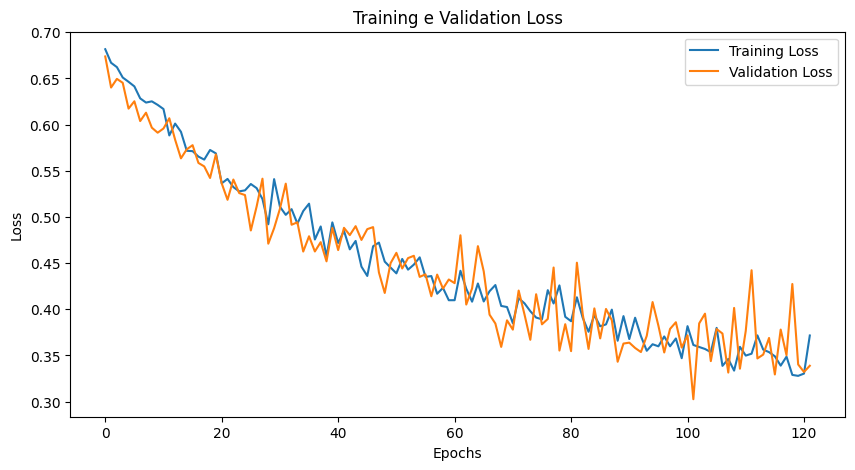

In [24]:
plot_comparison(train_losses, val_losses)

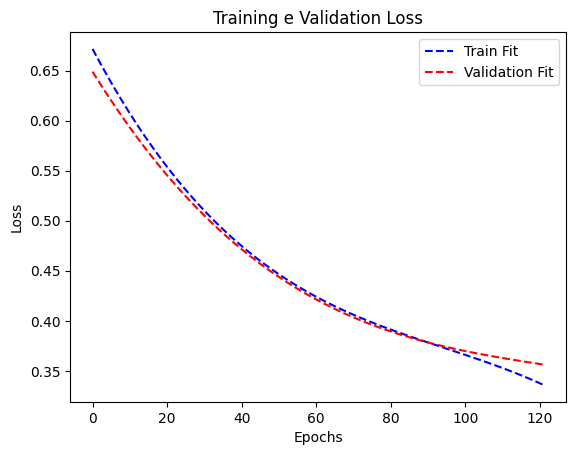

In [25]:
plot_equation(train_losses, val_losses)

In [26]:
resnet.load_state_dict(torch.load(model_save_path))
resnet.to(device)
print('')

In [27]:
preds, labels = evaluate_model(resnet, test_loader)
accuracy, conf_matrix, precision, recall, f1_score = calculate_metrics(preds, labels)

In [28]:
print_results(accuracy, conf_matrix, precision, recall, f1_score)

Acurácia: 0.9677
Matriz de Confusão:
[[10  0]
 [ 1 20]]
Precisão: 0.9707
Recall: 0.9677
F1 Score: 0.9681


 ## Modelo 2 - VGG

In [29]:
vgg = torchvision.models.vgg16(pretrained=True)

C:\Users\Cliente\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Cliente\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [30]:
vgg.classifier[6] = nn.Linear(4096, 2)

In [31]:
for name, params in vgg.named_parameters():
    if name not in ('classifier.6.weight', 'classifier.6.bias'):
        params.requires_grad = False

In [32]:
vgg.to(device)
optimizer = optim.Adam(vgg.parameters(), lr=0.0001)
model_save_path = 'top_vgg'

In [33]:
train_losses, val_losses = train(vgg, train_loader, val_loader, optimizer, criterion, epochs, early_stop_patience, model_save_path)

Epoch 1/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.20s/it]


Epoch: 1 | Train Loss: 0.6960 | Val Loss: 0.6903


Epoch 2/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.30s/it]


Epoch: 2 | Train Loss: 0.7287 | Val Loss: 0.6281


Epoch 3/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.29s/it]


Epoch: 3 | Train Loss: 0.6633 | Val Loss: 0.6795


Epoch 4/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.22s/it]


Epoch: 4 | Train Loss: 0.6489 | Val Loss: 0.6416


Epoch 5/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.22s/it]


Epoch: 5 | Train Loss: 0.6064 | Val Loss: 0.6172


Epoch 6/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.31s/it]


Epoch: 6 | Train Loss: 0.6198 | Val Loss: 0.5764


Epoch 7/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:40<00:00,  3.37s/it]


Epoch: 7 | Train Loss: 0.6045 | Val Loss: 0.5800


Epoch 8/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.22s/it]


Epoch: 8 | Train Loss: 0.5832 | Val Loss: 0.5462


Epoch 9/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.23s/it]


Epoch: 9 | Train Loss: 0.5492 | Val Loss: 0.5557


Epoch 10/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.22s/it]


Epoch: 10 | Train Loss: 0.5673 | Val Loss: 0.5308


Epoch 11/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.20s/it]


Epoch: 11 | Train Loss: 0.5326 | Val Loss: 0.5505


Epoch 12/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.24s/it]


Epoch: 12 | Train Loss: 0.5242 | Val Loss: 0.5639


Epoch 13/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.33s/it]


Epoch: 13 | Train Loss: 0.5278 | Val Loss: 0.4981


Epoch 14/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.24s/it]


Epoch: 14 | Train Loss: 0.5187 | Val Loss: 0.5223


Epoch 15/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 15 | Train Loss: 0.5500 | Val Loss: 0.4855


Epoch 16/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.29s/it]


Epoch: 16 | Train Loss: 0.5072 | Val Loss: 0.4831


Epoch 17/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.23s/it]


Epoch: 17 | Train Loss: 0.4981 | Val Loss: 0.5444


Epoch 18/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.26s/it]


Epoch: 18 | Train Loss: 0.4985 | Val Loss: 0.5100


Epoch 19/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.25s/it]


Epoch: 19 | Train Loss: 0.5025 | Val Loss: 0.5129


Epoch 20/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.33s/it]


Epoch: 20 | Train Loss: 0.5010 | Val Loss: 0.5453


Epoch 21/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.32s/it]


Epoch: 21 | Train Loss: 0.4786 | Val Loss: 0.4992


Epoch 22/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.31s/it]


Epoch: 22 | Train Loss: 0.4399 | Val Loss: 0.4707


Epoch 23/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.29s/it]


Epoch: 23 | Train Loss: 0.4271 | Val Loss: 0.5108


Epoch 24/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:40<00:00,  3.34s/it]


Epoch: 24 | Train Loss: 0.4836 | Val Loss: 0.5443


Epoch 25/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.26s/it]


Epoch: 25 | Train Loss: 0.4628 | Val Loss: 0.4591


Epoch 26/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.22s/it]


Epoch: 26 | Train Loss: 0.4422 | Val Loss: 0.5059


Epoch 27/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.06s/it]


Epoch: 27 | Train Loss: 0.4492 | Val Loss: 0.4807


Epoch 28/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:35<00:00,  2.94s/it]


Epoch: 28 | Train Loss: 0.4469 | Val Loss: 0.4629


Epoch 29/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.24s/it]


Epoch: 29 | Train Loss: 0.4696 | Val Loss: 0.4797


Epoch 30/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.02s/it]


Epoch: 30 | Train Loss: 0.4405 | Val Loss: 0.5033


Epoch 31/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:35<00:00,  2.96s/it]


Epoch: 31 | Train Loss: 0.4257 | Val Loss: 0.4165


Epoch 32/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.01s/it]


Epoch: 32 | Train Loss: 0.4080 | Val Loss: 0.4185


Epoch 33/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 33 | Train Loss: 0.4721 | Val Loss: 0.4040


Epoch 34/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.18s/it]


Epoch: 34 | Train Loss: 0.4162 | Val Loss: 0.4512


Epoch 35/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.06s/it]


Epoch: 35 | Train Loss: 0.4367 | Val Loss: 0.5002


Epoch 36/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.05s/it]


Epoch: 36 | Train Loss: 0.4518 | Val Loss: 0.4889


Epoch 37/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.06s/it]


Epoch: 37 | Train Loss: 0.4113 | Val Loss: 0.4142


Epoch 38/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.06s/it]


Epoch: 38 | Train Loss: 0.4511 | Val Loss: 0.5002


Epoch 39/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.06s/it]


Epoch: 39 | Train Loss: 0.4372 | Val Loss: 0.4658


Epoch 40/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.05s/it]


Epoch: 40 | Train Loss: 0.3713 | Val Loss: 0.4752


Epoch 41/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.03s/it]


Epoch: 41 | Train Loss: 0.4263 | Val Loss: 0.5107


Epoch 42/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.05s/it]


Epoch: 42 | Train Loss: 0.3961 | Val Loss: 0.4702


Epoch 43/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.07s/it]


Epoch: 43 | Train Loss: 0.3756 | Val Loss: 0.4426


Epoch 44/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.02s/it]


Epoch: 44 | Train Loss: 0.4022 | Val Loss: 0.3962


Epoch 45/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.17s/it]


Epoch: 45 | Train Loss: 0.3929 | Val Loss: 0.4439


Epoch 46/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.15s/it]


Epoch: 46 | Train Loss: 0.4198 | Val Loss: 0.5901


Epoch 47/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 47 | Train Loss: 0.4418 | Val Loss: 0.4855


Epoch 48/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Epoch: 48 | Train Loss: 0.3805 | Val Loss: 0.4895


Epoch 49/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.15s/it]


Epoch: 49 | Train Loss: 0.4030 | Val Loss: 0.4231


Epoch 50/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 50 | Train Loss: 0.4005 | Val Loss: 0.4602


Epoch 51/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 51 | Train Loss: 0.3740 | Val Loss: 0.4408


Epoch 52/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 52 | Train Loss: 0.3997 | Val Loss: 0.4409


Epoch 53/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 53 | Train Loss: 0.4105 | Val Loss: 0.4221


Epoch 54/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.10s/it]


Epoch: 54 | Train Loss: 0.3894 | Val Loss: 0.4238


Epoch 55/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Epoch: 55 | Train Loss: 0.3914 | Val Loss: 0.3916


Epoch 56/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.19s/it]


Epoch: 56 | Train Loss: 0.3980 | Val Loss: 0.4999


Epoch 57/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.18s/it]


Epoch: 57 | Train Loss: 0.3799 | Val Loss: 0.4727


Epoch 58/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.20s/it]


Epoch: 58 | Train Loss: 0.4236 | Val Loss: 0.4002


Epoch 59/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Epoch: 59 | Train Loss: 0.4050 | Val Loss: 0.4557


Epoch 60/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 60 | Train Loss: 0.3743 | Val Loss: 0.4445


Epoch 61/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 61 | Train Loss: 0.3925 | Val Loss: 0.3869


Epoch 62/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.18s/it]


Epoch: 62 | Train Loss: 0.4414 | Val Loss: 0.4135


Epoch 63/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 63 | Train Loss: 0.3699 | Val Loss: 0.4053


Epoch 64/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 64 | Train Loss: 0.3939 | Val Loss: 0.4085


Epoch 65/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.19s/it]


Epoch: 65 | Train Loss: 0.4220 | Val Loss: 0.4258


Epoch 66/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.10s/it]


Epoch: 66 | Train Loss: 0.3214 | Val Loss: 0.5040


Epoch 67/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.08s/it]


Epoch: 67 | Train Loss: 0.3537 | Val Loss: 0.3553


Epoch 68/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 68 | Train Loss: 0.3599 | Val Loss: 0.3435


Epoch 69/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.10s/it]


Epoch: 69 | Train Loss: 0.3920 | Val Loss: 0.3389


Epoch 70/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.21s/it]


Epoch: 70 | Train Loss: 0.3504 | Val Loss: 0.3726


Epoch 71/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 71 | Train Loss: 0.3646 | Val Loss: 0.4736


Epoch 72/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.03s/it]


Epoch: 72 | Train Loss: 0.3348 | Val Loss: 0.4651


Epoch 73/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.15s/it]


Epoch: 73 | Train Loss: 0.3217 | Val Loss: 0.4664


Epoch 74/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.17s/it]


Epoch: 74 | Train Loss: 0.3721 | Val Loss: 0.3595


Epoch 75/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.19s/it]


Epoch: 75 | Train Loss: 0.3540 | Val Loss: 0.4913


Epoch 76/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 76 | Train Loss: 0.2960 | Val Loss: 0.4019


Epoch 77/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 77 | Train Loss: 0.3920 | Val Loss: 0.3931


Epoch 78/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 78 | Train Loss: 0.3454 | Val Loss: 0.4446


Epoch 79/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.13s/it]


Epoch: 79 | Train Loss: 0.3997 | Val Loss: 0.3576


Epoch 80/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 80 | Train Loss: 0.3590 | Val Loss: 0.3636


Epoch 81/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 81 | Train Loss: 0.2916 | Val Loss: 0.4329


Epoch 82/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 82 | Train Loss: 0.3601 | Val Loss: 0.4842


Epoch 83/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 83 | Train Loss: 0.3694 | Val Loss: 0.3055


Epoch 84/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.15s/it]


Epoch: 84 | Train Loss: 0.3766 | Val Loss: 0.4107


Epoch 85/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 85 | Train Loss: 0.3753 | Val Loss: 0.4642


Epoch 86/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 86 | Train Loss: 0.3149 | Val Loss: 0.4630


Epoch 87/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 87 | Train Loss: 0.3690 | Val Loss: 0.3654


Epoch 88/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.18s/it]


Epoch: 88 | Train Loss: 0.3791 | Val Loss: 0.3269


Epoch 89/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 89 | Train Loss: 0.3449 | Val Loss: 0.4827


Epoch 90/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.17s/it]


Epoch: 90 | Train Loss: 0.3595 | Val Loss: 0.4420


Epoch 91/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.10s/it]


Epoch: 91 | Train Loss: 0.3229 | Val Loss: 0.3560


Epoch 92/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 92 | Train Loss: 0.3723 | Val Loss: 0.3410


Epoch 93/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.13s/it]


Epoch: 93 | Train Loss: 0.3633 | Val Loss: 0.3883


Epoch 94/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 94 | Train Loss: 0.3894 | Val Loss: 0.3303


Epoch 95/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.13s/it]


Epoch: 95 | Train Loss: 0.3376 | Val Loss: 0.4023


Epoch 96/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 96 | Train Loss: 0.4189 | Val Loss: 0.3424


Epoch 97/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.13s/it]


Epoch: 97 | Train Loss: 0.3621 | Val Loss: 0.4143


Epoch 98/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.15s/it]


Epoch: 98 | Train Loss: 0.3572 | Val Loss: 0.4127


Epoch 99/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.12s/it]


Epoch: 99 | Train Loss: 0.3854 | Val Loss: 0.4465


Epoch 100/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.14s/it]


Epoch: 100 | Train Loss: 0.3646 | Val Loss: 0.4472


Epoch 101/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.15s/it]


Epoch: 101 | Train Loss: 0.3590 | Val Loss: 0.3212


Epoch 102/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 102 | Train Loss: 0.3611 | Val Loss: 0.2845


Epoch 103/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.19s/it]


Epoch: 103 | Train Loss: 0.2789 | Val Loss: 0.3096


Epoch 104/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.21s/it]


Epoch: 104 | Train Loss: 0.3186 | Val Loss: 0.3486


Epoch 105/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 105 | Train Loss: 0.3047 | Val Loss: 0.4096


Epoch 106/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.10s/it]


Epoch: 106 | Train Loss: 0.3454 | Val Loss: 0.4109


Epoch 107/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.16s/it]


Epoch: 107 | Train Loss: 0.4179 | Val Loss: 0.3107


Epoch 108/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Epoch: 108 | Train Loss: 0.3150 | Val Loss: 0.5351


Epoch 109/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 109 | Train Loss: 0.3493 | Val Loss: 0.4186


Epoch 110/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.13s/it]


Epoch: 110 | Train Loss: 0.2874 | Val Loss: 0.3403


Epoch 111/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.07s/it]


Epoch: 111 | Train Loss: 0.2925 | Val Loss: 0.5140


Epoch 112/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.04s/it]


Epoch: 112 | Train Loss: 0.3408 | Val Loss: 0.3093


Epoch 113/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.11s/it]


Epoch: 113 | Train Loss: 0.3357 | Val Loss: 0.3975


Epoch 114/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.08s/it]


Epoch: 114 | Train Loss: 0.3631 | Val Loss: 0.3449


Epoch 115/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:38<00:00,  3.19s/it]


Epoch: 115 | Train Loss: 0.3769 | Val Loss: 0.4231


Epoch 116/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Epoch: 116 | Train Loss: 0.3720 | Val Loss: 0.3892


Epoch 117/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Epoch: 117 | Train Loss: 0.3373 | Val Loss: 0.4355


Epoch 118/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.29s/it]


Epoch: 118 | Train Loss: 0.3074 | Val Loss: 0.4860


Epoch 119/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:40<00:00,  3.35s/it]


Epoch: 119 | Train Loss: 0.3386 | Val Loss: 0.5153


Epoch 120/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:40<00:00,  3.37s/it]


Epoch: 120 | Train Loss: 0.3212 | Val Loss: 0.2964


Epoch 121/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:40<00:00,  3.33s/it]


Epoch: 121 | Train Loss: 0.3443 | Val Loss: 0.3493


Epoch 122/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.31s/it]


Epoch: 122 | Train Loss: 0.3318 | Val Loss: 0.3410
Validation loss parou de melhorar após 20 epochs. Early stopping!


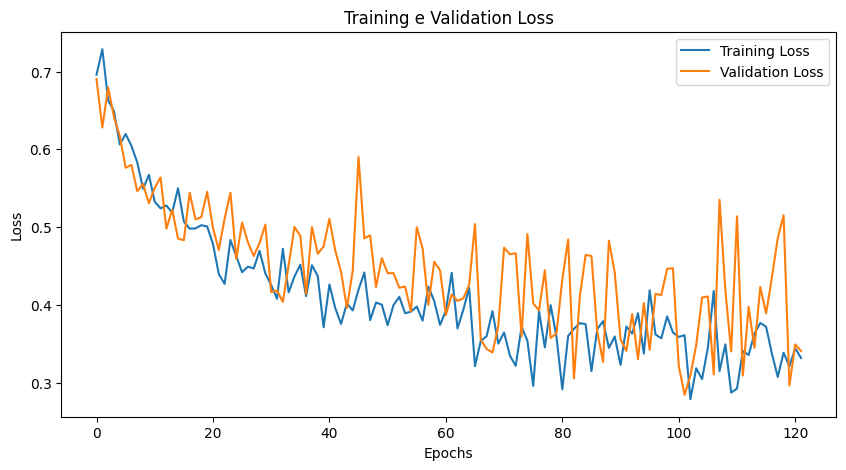

In [34]:
plot_comparison(train_losses, val_losses)

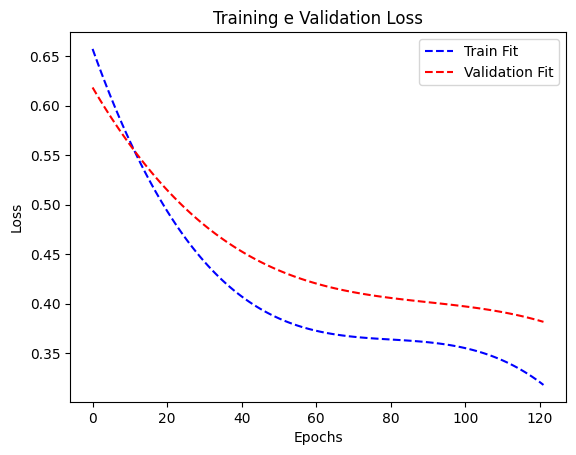

In [35]:
plot_equation(train_losses, val_losses)

In [36]:
vgg.load_state_dict(torch.load(model_save_path))
vgg.to(device)
print('')

In [37]:
preds, labels = evaluate_model(vgg, test_loader)
accuracy, conf_matrix, precision, recall, f1_score = calculate_metrics(preds, labels)

In [38]:
print_results(accuracy, conf_matrix, precision, recall, f1_score)

Acurácia: 0.8710
Matriz de Confusão:
[[ 8  2]
 [ 2 19]]
Precisão: 0.8710
Recall: 0.8710
F1 Score: 0.8710


## Modelo 3 - Inception

In [39]:
inception = torchvision.models.inception_v3(weights=torchvision.models.Inception_V3_Weights.DEFAULT)

In [40]:
inception.fc = nn.Linear(2048, 2)

In [41]:
for name, params in inception.named_parameters():
    if not ('fc' in name or 'AuxLogits.fc' in name):
        params.requires_grad = False

In [42]:
inception.to(device)
optimizer = optim.Adam(inception.parameters(), lr=0.0001)
model_save_path = 'top_inception'

In [43]:
train_losses, val_losses = train(inception, train_loader, val_loader, optimizer, criterion, epochs, early_stop_patience, model_save_path)

Epoch 1/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:16<00:00,  1.41s/it]


Epoch: 1 | Train Loss: 0.6983 | Val Loss: 0.6483


Epoch 2/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:16<00:00,  1.40s/it]


Epoch: 2 | Train Loss: 0.6930 | Val Loss: 0.6996


Epoch 3/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:16<00:00,  1.41s/it]


Epoch: 3 | Train Loss: 0.6991 | Val Loss: 0.6723


Epoch 4/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 4 | Train Loss: 0.6984 | Val Loss: 0.6821


Epoch 5/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [06:55<00:00, 34.58s/it]


Epoch: 5 | Train Loss: 0.6842 | Val Loss: 0.6699


Epoch 6/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.33s/it]


Epoch: 6 | Train Loss: 0.6884 | Val Loss: 0.6668


Epoch 7/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 7 | Train Loss: 0.6850 | Val Loss: 0.6733


Epoch 8/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 8 | Train Loss: 0.6771 | Val Loss: 0.6396


Epoch 9/300: 100%|█████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.33s/it]


Epoch: 9 | Train Loss: 0.6942 | Val Loss: 0.6477


Epoch 10/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 10 | Train Loss: 0.6713 | Val Loss: 0.6151


Epoch 11/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 11 | Train Loss: 0.6457 | Val Loss: 0.6163


Epoch 12/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 12 | Train Loss: 0.6295 | Val Loss: 0.6164


Epoch 13/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 13 | Train Loss: 0.6649 | Val Loss: 0.6192


Epoch 14/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 14 | Train Loss: 0.6195 | Val Loss: 0.6217


Epoch 15/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 15 | Train Loss: 0.6411 | Val Loss: 0.6190


Epoch 16/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 16 | Train Loss: 0.6117 | Val Loss: 0.6089


Epoch 17/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.32s/it]


Epoch: 17 | Train Loss: 0.6096 | Val Loss: 0.6164


Epoch 18/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 18 | Train Loss: 0.5963 | Val Loss: 0.5751


Epoch 19/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 19 | Train Loss: 0.6046 | Val Loss: 0.5628


Epoch 20/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 20 | Train Loss: 0.5924 | Val Loss: 0.5566


Epoch 21/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 21 | Train Loss: 0.6028 | Val Loss: 0.5821


Epoch 22/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 22 | Train Loss: 0.5820 | Val Loss: 0.6099


Epoch 23/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 23 | Train Loss: 0.6128 | Val Loss: 0.5441


Epoch 24/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 24 | Train Loss: 0.6213 | Val Loss: 0.6003


Epoch 25/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.29s/it]


Epoch: 25 | Train Loss: 0.5704 | Val Loss: 0.5218


Epoch 26/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.32s/it]


Epoch: 26 | Train Loss: 0.6040 | Val Loss: 0.5574


Epoch 27/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 27 | Train Loss: 0.5811 | Val Loss: 0.5354


Epoch 28/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 28 | Train Loss: 0.5676 | Val Loss: 0.5544


Epoch 29/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 29 | Train Loss: 0.5775 | Val Loss: 0.5548


Epoch 30/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 30 | Train Loss: 0.5880 | Val Loss: 0.5519


Epoch 31/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 31 | Train Loss: 0.5705 | Val Loss: 0.5506


Epoch 32/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 32 | Train Loss: 0.5996 | Val Loss: 0.5439


Epoch 33/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 33 | Train Loss: 0.5824 | Val Loss: 0.5751


Epoch 34/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 34 | Train Loss: 0.5518 | Val Loss: 0.5372


Epoch 35/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 35 | Train Loss: 0.5672 | Val Loss: 0.5673


Epoch 36/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 36 | Train Loss: 0.5456 | Val Loss: 0.5252


Epoch 37/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 37 | Train Loss: 0.5854 | Val Loss: 0.5523


Epoch 38/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 38 | Train Loss: 0.5542 | Val Loss: 0.5319


Epoch 39/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 39 | Train Loss: 0.5666 | Val Loss: 0.5639


Epoch 40/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 40 | Train Loss: 0.5600 | Val Loss: 0.5256


Epoch 41/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 41 | Train Loss: 0.5566 | Val Loss: 0.5470


Epoch 42/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 42 | Train Loss: 0.5136 | Val Loss: 0.5465


Epoch 43/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 43 | Train Loss: 0.5658 | Val Loss: 0.5119


Epoch 44/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 44 | Train Loss: 0.5365 | Val Loss: 0.5496


Epoch 45/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.29s/it]


Epoch: 45 | Train Loss: 0.5428 | Val Loss: 0.5515


Epoch 46/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 46 | Train Loss: 0.5585 | Val Loss: 0.5010


Epoch 47/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 47 | Train Loss: 0.5137 | Val Loss: 0.5244


Epoch 48/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 48 | Train Loss: 0.5655 | Val Loss: 0.5948


Epoch 49/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 49 | Train Loss: 0.5687 | Val Loss: 0.4767


Epoch 50/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 50 | Train Loss: 0.5182 | Val Loss: 0.4997


Epoch 51/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.29s/it]


Epoch: 51 | Train Loss: 0.5445 | Val Loss: 0.5025


Epoch 52/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 52 | Train Loss: 0.5152 | Val Loss: 0.5168


Epoch 53/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 53 | Train Loss: 0.5252 | Val Loss: 0.5123


Epoch 54/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 54 | Train Loss: 0.5691 | Val Loss: 0.5116


Epoch 55/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 55 | Train Loss: 0.5671 | Val Loss: 0.5128


Epoch 56/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 56 | Train Loss: 0.5099 | Val Loss: 0.4533


Epoch 57/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 57 | Train Loss: 0.5388 | Val Loss: 0.4611


Epoch 58/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.29s/it]


Epoch: 58 | Train Loss: 0.5027 | Val Loss: 0.4726


Epoch 59/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 59 | Train Loss: 0.5304 | Val Loss: 0.5361


Epoch 60/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 60 | Train Loss: 0.5541 | Val Loss: 0.5026


Epoch 61/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 61 | Train Loss: 0.4816 | Val Loss: 0.4844


Epoch 62/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 62 | Train Loss: 0.5239 | Val Loss: 0.5739


Epoch 63/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 63 | Train Loss: 0.5316 | Val Loss: 0.5063


Epoch 64/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 64 | Train Loss: 0.5386 | Val Loss: 0.4754


Epoch 65/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 65 | Train Loss: 0.4989 | Val Loss: 0.5157


Epoch 66/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 66 | Train Loss: 0.4933 | Val Loss: 0.5128


Epoch 67/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:16<00:00,  1.37s/it]


Epoch: 67 | Train Loss: 0.5220 | Val Loss: 0.4367


Epoch 68/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 68 | Train Loss: 0.5091 | Val Loss: 0.4883


Epoch 69/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 69 | Train Loss: 0.4888 | Val Loss: 0.4416


Epoch 70/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 70 | Train Loss: 0.5421 | Val Loss: 0.4531


Epoch 71/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 71 | Train Loss: 0.5132 | Val Loss: 0.5329


Epoch 72/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 72 | Train Loss: 0.5400 | Val Loss: 0.5062


Epoch 73/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 73 | Train Loss: 0.5568 | Val Loss: 0.4525


Epoch 74/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 74 | Train Loss: 0.5280 | Val Loss: 0.4914


Epoch 75/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 75 | Train Loss: 0.4881 | Val Loss: 0.4664


Epoch 76/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.21s/it]


Epoch: 76 | Train Loss: 0.5078 | Val Loss: 0.4894


Epoch 77/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 77 | Train Loss: 0.4357 | Val Loss: 0.4587


Epoch 78/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 78 | Train Loss: 0.4623 | Val Loss: 0.5014


Epoch 79/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 79 | Train Loss: 0.4852 | Val Loss: 0.5168


Epoch 80/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 80 | Train Loss: 0.4850 | Val Loss: 0.4202


Epoch 81/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:16<00:00,  1.35s/it]


Epoch: 81 | Train Loss: 0.4885 | Val Loss: 0.5043


Epoch 82/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 82 | Train Loss: 0.4960 | Val Loss: 0.5065


Epoch 83/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 83 | Train Loss: 0.4980 | Val Loss: 0.4496


Epoch 84/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 84 | Train Loss: 0.4782 | Val Loss: 0.4247


Epoch 85/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 85 | Train Loss: 0.5196 | Val Loss: 0.4613


Epoch 86/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 86 | Train Loss: 0.4958 | Val Loss: 0.4490


Epoch 87/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 87 | Train Loss: 0.4766 | Val Loss: 0.4870


Epoch 88/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 88 | Train Loss: 0.4523 | Val Loss: 0.4830


Epoch 89/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 89 | Train Loss: 0.4364 | Val Loss: 0.4099


Epoch 90/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.32s/it]


Epoch: 90 | Train Loss: 0.4949 | Val Loss: 0.4382


Epoch 91/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 91 | Train Loss: 0.4889 | Val Loss: 0.4409


Epoch 92/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 92 | Train Loss: 0.4744 | Val Loss: 0.4613


Epoch 93/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 93 | Train Loss: 0.4928 | Val Loss: 0.4976


Epoch 94/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 94 | Train Loss: 0.4635 | Val Loss: 0.5104


Epoch 95/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 95 | Train Loss: 0.5282 | Val Loss: 0.4337


Epoch 96/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 96 | Train Loss: 0.5177 | Val Loss: 0.4752


Epoch 97/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 97 | Train Loss: 0.4815 | Val Loss: 0.4339


Epoch 98/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 98 | Train Loss: 0.4767 | Val Loss: 0.4921


Epoch 99/300: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 99 | Train Loss: 0.4785 | Val Loss: 0.4458


Epoch 100/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 100 | Train Loss: 0.4434 | Val Loss: 0.4619


Epoch 101/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 101 | Train Loss: 0.4976 | Val Loss: 0.3987


Epoch 102/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 102 | Train Loss: 0.4648 | Val Loss: 0.5418


Epoch 103/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 103 | Train Loss: 0.4875 | Val Loss: 0.4642


Epoch 104/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 104 | Train Loss: 0.5123 | Val Loss: 0.4118


Epoch 105/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.21s/it]


Epoch: 105 | Train Loss: 0.4382 | Val Loss: 0.4290


Epoch 106/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 106 | Train Loss: 0.5073 | Val Loss: 0.4397


Epoch 107/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 107 | Train Loss: 0.4904 | Val Loss: 0.4635


Epoch 108/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 108 | Train Loss: 0.4620 | Val Loss: 0.4901


Epoch 109/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 109 | Train Loss: 0.4583 | Val Loss: 0.4038


Epoch 110/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 110 | Train Loss: 0.5169 | Val Loss: 0.4419


Epoch 111/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 111 | Train Loss: 0.4640 | Val Loss: 0.4790


Epoch 112/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.21s/it]


Epoch: 112 | Train Loss: 0.4435 | Val Loss: 0.4324


Epoch 113/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 113 | Train Loss: 0.4245 | Val Loss: 0.5345


Epoch 114/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 114 | Train Loss: 0.4410 | Val Loss: 0.3982


Epoch 115/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 115 | Train Loss: 0.4929 | Val Loss: 0.4053


Epoch 116/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.29s/it]


Epoch: 116 | Train Loss: 0.4329 | Val Loss: 0.4898


Epoch 117/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 117 | Train Loss: 0.4403 | Val Loss: 0.4442


Epoch 118/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 118 | Train Loss: 0.4897 | Val Loss: 0.3790


Epoch 119/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


Epoch: 119 | Train Loss: 0.4501 | Val Loss: 0.3611


Epoch 120/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.29s/it]


Epoch: 120 | Train Loss: 0.4935 | Val Loss: 0.4680


Epoch 121/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 121 | Train Loss: 0.4716 | Val Loss: 0.3921


Epoch 122/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.22s/it]


Epoch: 122 | Train Loss: 0.4543 | Val Loss: 0.4604


Epoch 123/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 123 | Train Loss: 0.4637 | Val Loss: 0.4403


Epoch 124/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 124 | Train Loss: 0.4681 | Val Loss: 0.4472


Epoch 125/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 125 | Train Loss: 0.4557 | Val Loss: 0.4339


Epoch 126/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 126 | Train Loss: 0.4465 | Val Loss: 0.4959


Epoch 127/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 127 | Train Loss: 0.4341 | Val Loss: 0.3807


Epoch 128/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.21s/it]


Epoch: 128 | Train Loss: 0.4786 | Val Loss: 0.4679


Epoch 129/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 129 | Train Loss: 0.4434 | Val Loss: 0.4365


Epoch 130/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 130 | Train Loss: 0.4610 | Val Loss: 0.4616


Epoch 131/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 131 | Train Loss: 0.4466 | Val Loss: 0.4190


Epoch 132/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 132 | Train Loss: 0.4303 | Val Loss: 0.5467


Epoch 133/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 133 | Train Loss: 0.4704 | Val Loss: 0.5150


Epoch 134/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 134 | Train Loss: 0.4798 | Val Loss: 0.3515


Epoch 135/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.31s/it]


Epoch: 135 | Train Loss: 0.5100 | Val Loss: 0.5198


Epoch 136/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.28s/it]


Epoch: 136 | Train Loss: 0.4427 | Val Loss: 0.4558


Epoch 137/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 137 | Train Loss: 0.4524 | Val Loss: 0.4713


Epoch 138/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]


Epoch: 138 | Train Loss: 0.4632 | Val Loss: 0.4929


Epoch 139/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 139 | Train Loss: 0.4398 | Val Loss: 0.3853


Epoch 140/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 140 | Train Loss: 0.4179 | Val Loss: 0.4372


Epoch 141/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 141 | Train Loss: 0.4176 | Val Loss: 0.4044


Epoch 142/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 142 | Train Loss: 0.4916 | Val Loss: 0.4618


Epoch 143/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.25s/it]


Epoch: 143 | Train Loss: 0.4390 | Val Loss: 0.4179


Epoch 144/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 144 | Train Loss: 0.5055 | Val Loss: 0.3682


Epoch 145/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 145 | Train Loss: 0.4305 | Val Loss: 0.5040


Epoch 146/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 146 | Train Loss: 0.4292 | Val Loss: 0.4515


Epoch 147/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 147 | Train Loss: 0.4678 | Val Loss: 0.4241


Epoch 148/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 148 | Train Loss: 0.4776 | Val Loss: 0.3977


Epoch 149/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 149 | Train Loss: 0.4584 | Val Loss: 0.3990


Epoch 150/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.21s/it]


Epoch: 150 | Train Loss: 0.4747 | Val Loss: 0.4277


Epoch 151/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.25s/it]


Epoch: 151 | Train Loss: 0.3996 | Val Loss: 0.4159


Epoch 152/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.24s/it]


Epoch: 152 | Train Loss: 0.4666 | Val Loss: 0.4611


Epoch 153/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.26s/it]


Epoch: 153 | Train Loss: 0.4557 | Val Loss: 0.4415


Epoch 154/300: 100%|███████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.23s/it]


Epoch: 154 | Train Loss: 0.4306 | Val Loss: 0.3862
Validation loss parou de melhorar após 20 epochs. Early stopping!


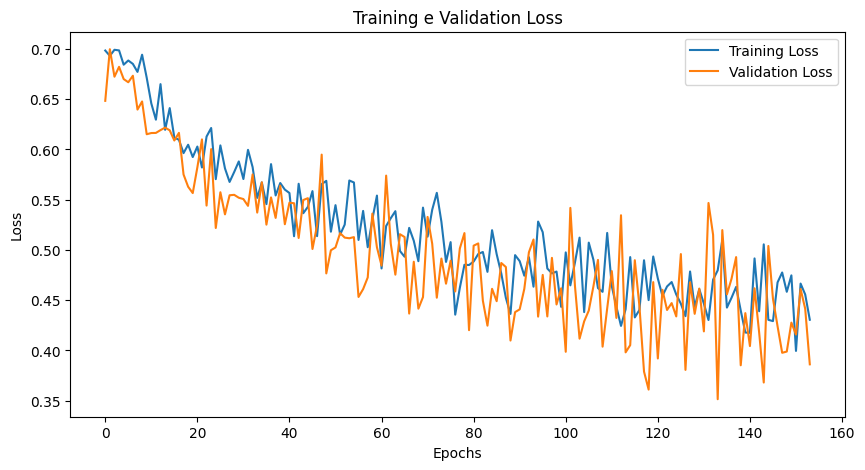

In [44]:
plot_comparison(train_losses, val_losses)

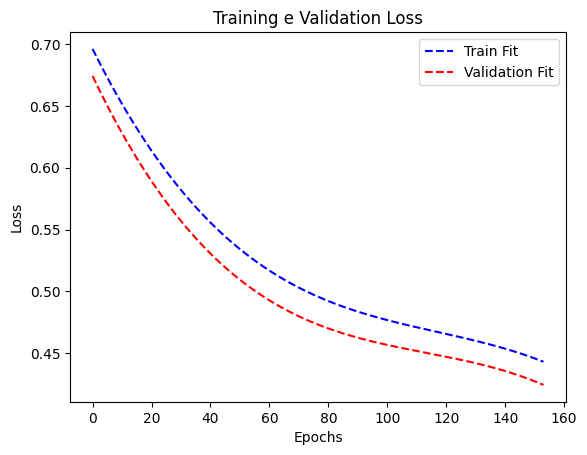

In [45]:
plot_equation(train_losses, val_losses)

In [46]:
inception.load_state_dict(torch.load(model_save_path))
inception.to(device)
print('')

In [47]:
preds, labels = evaluate_model(inception, test_loader)
accuracy, conf_matrix, precision, recall, f1_score = calculate_metrics(preds, labels)

In [48]:
print_results(accuracy, conf_matrix, precision, recall, f1_score)

Acurácia: 0.7742
Matriz de Confusão:
[[ 8  2]
 [ 5 16]]
Precisão: 0.8007
Recall: 0.7742
F1 Score: 0.7802


---

# Comparando os Modelos

    - Comparação entre:
        > Resnet
        > VGG
        > Inception


In [49]:
def predict(model, image):
    prediction = model(torch.unsqueeze(image, 0).to(device))
    result = torch.argmax(prediction)
    return 'Carlos' if result == 0 else 'Urien'

---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


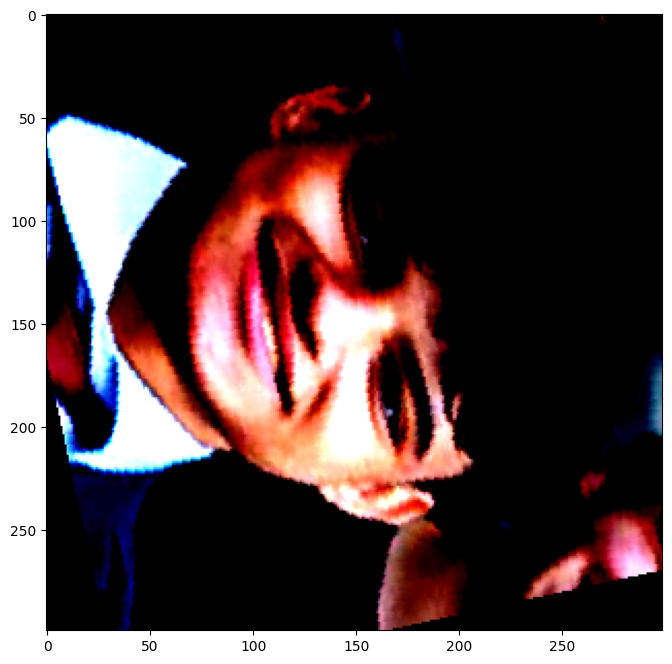

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


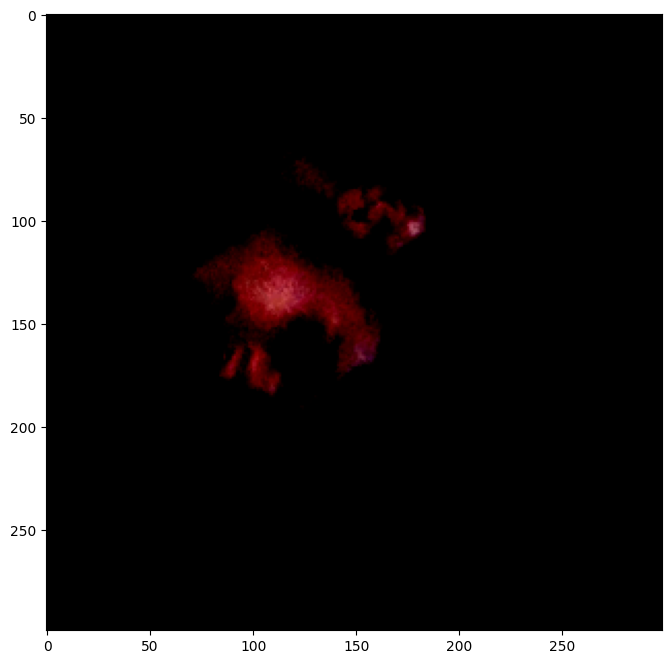

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


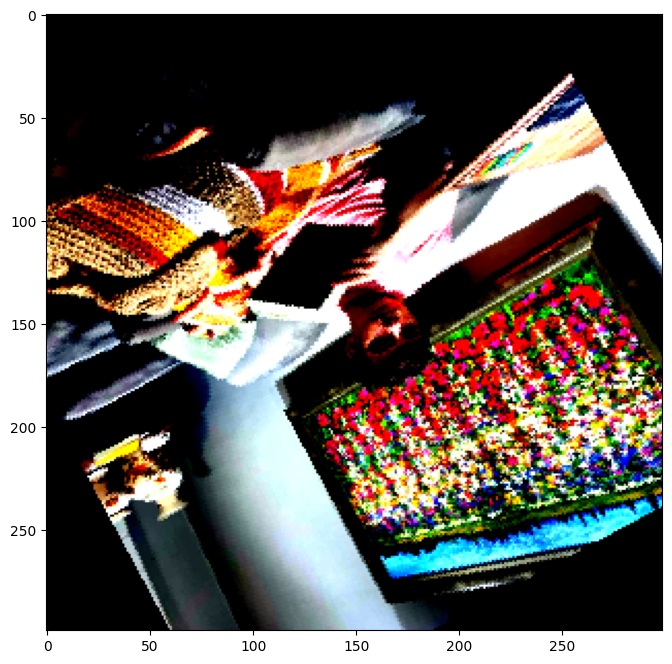

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Urien


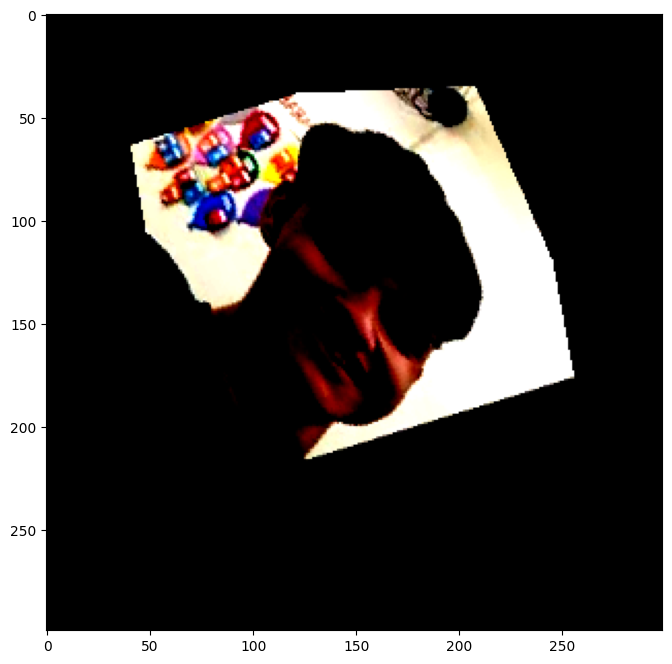

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


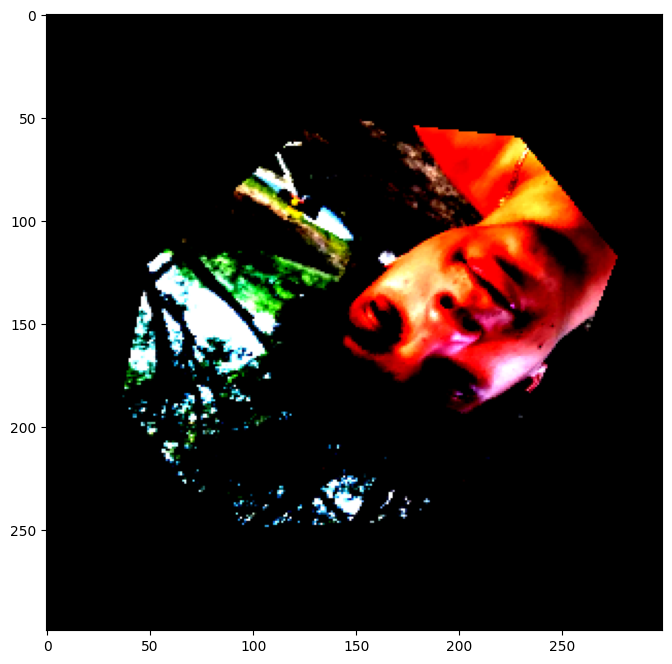

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


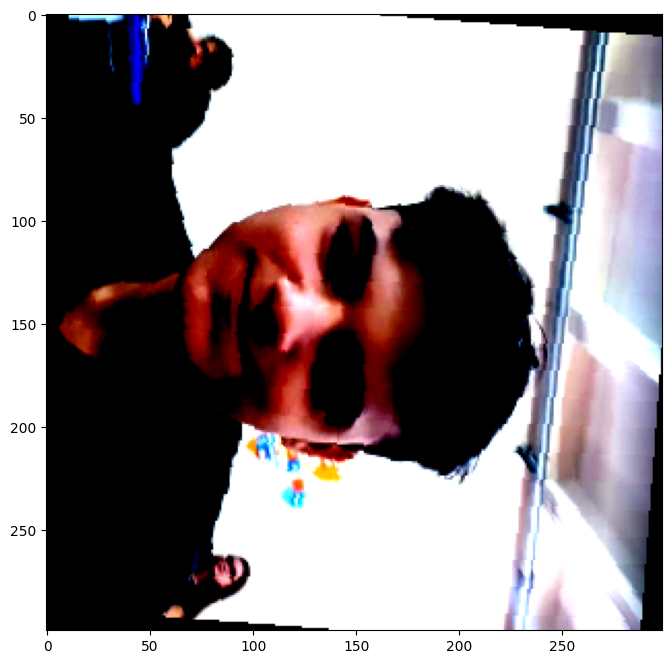

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Carlos


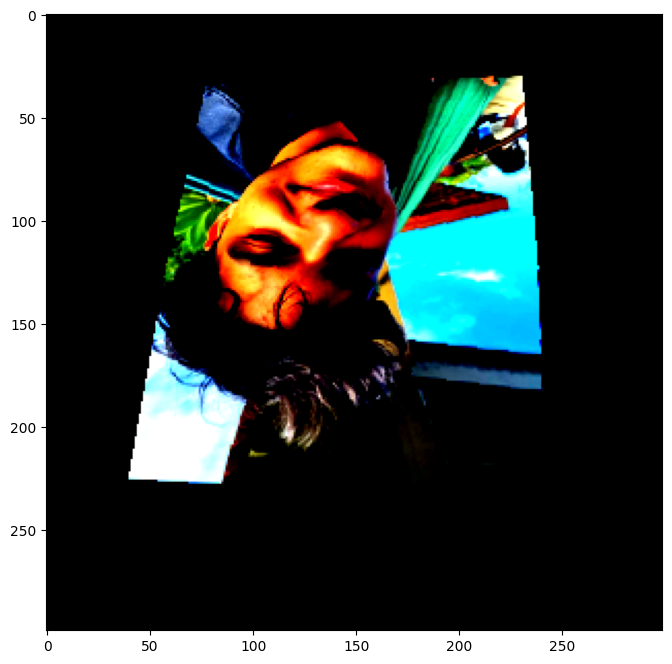

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


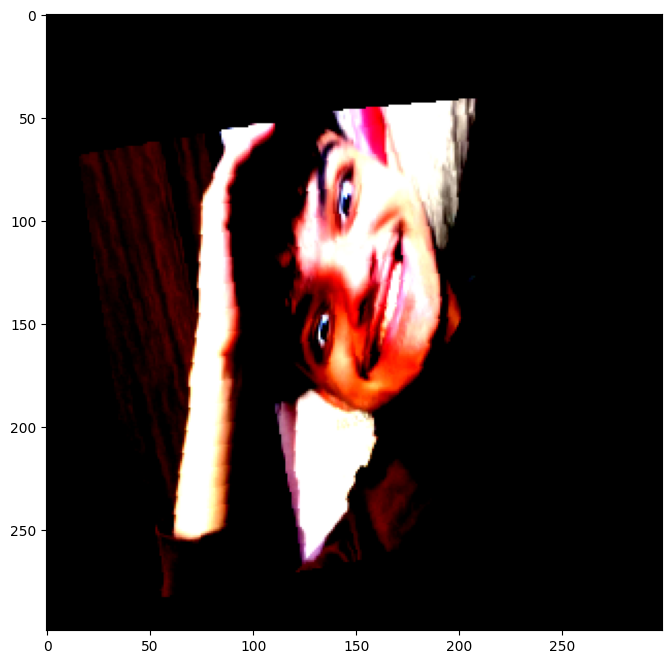

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


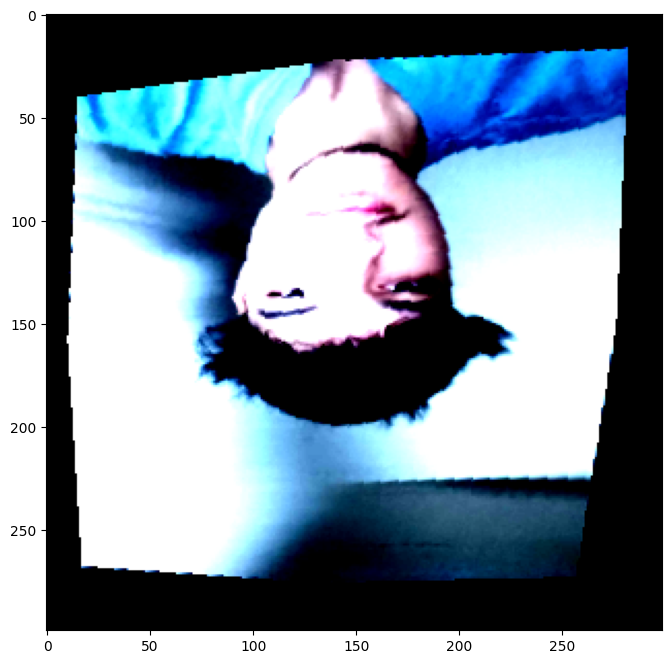

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


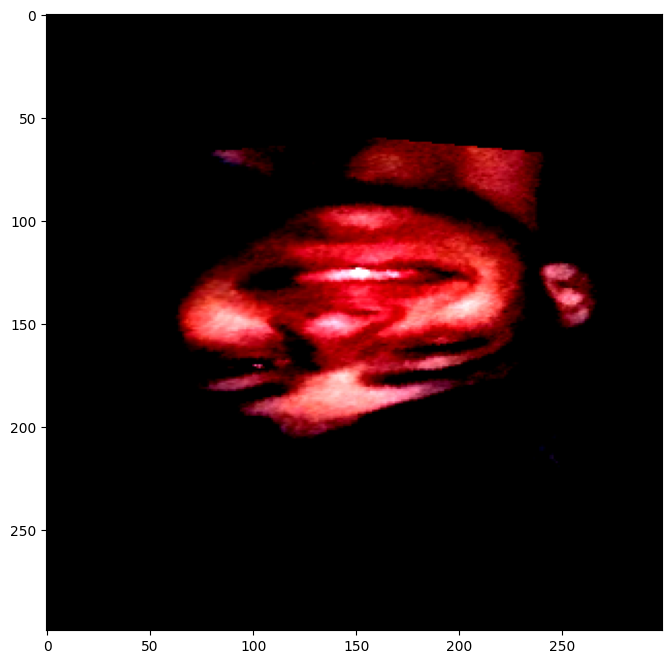

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Urien


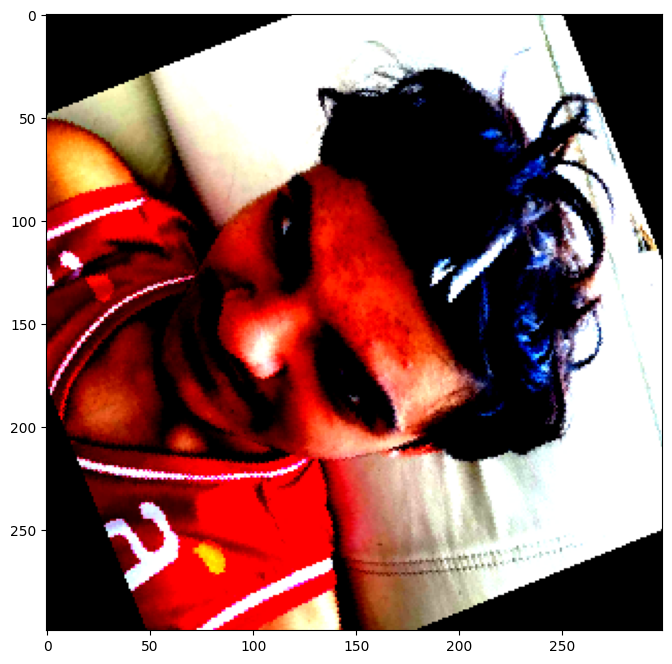

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


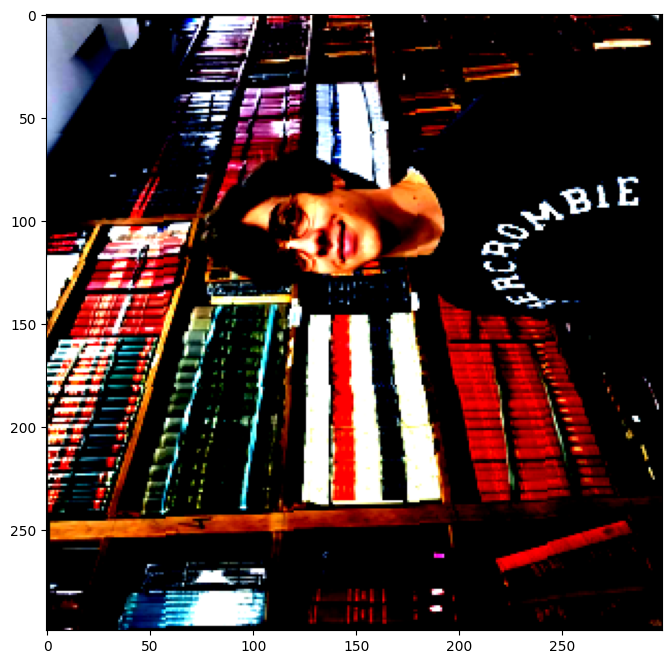

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


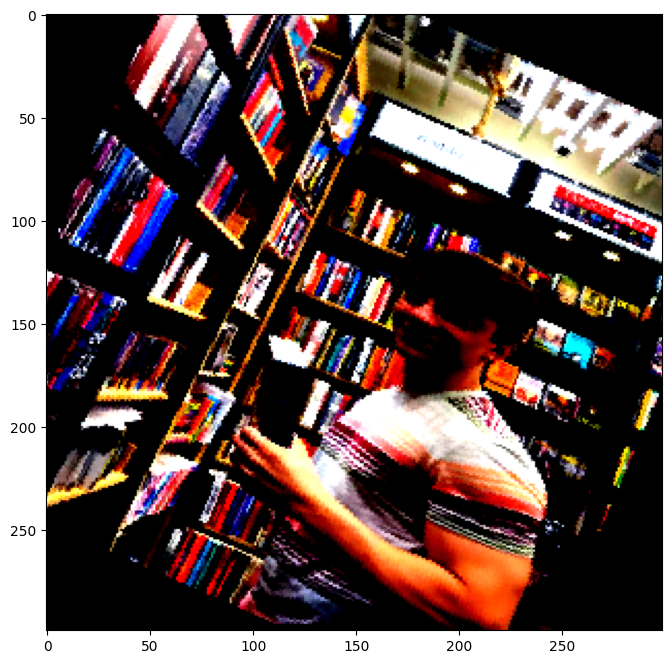

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Carlos


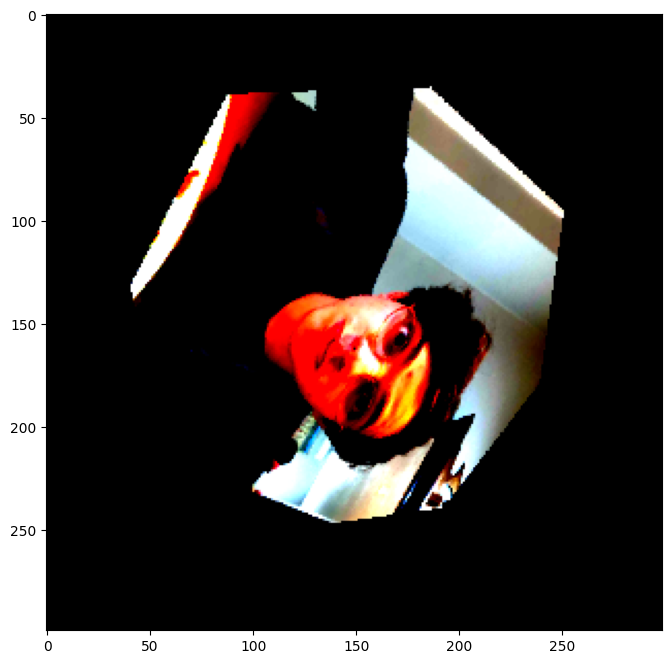

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


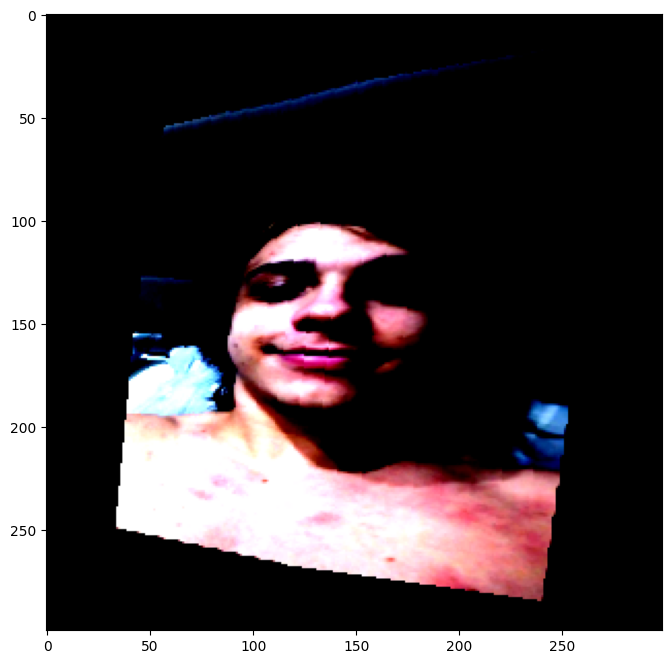

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


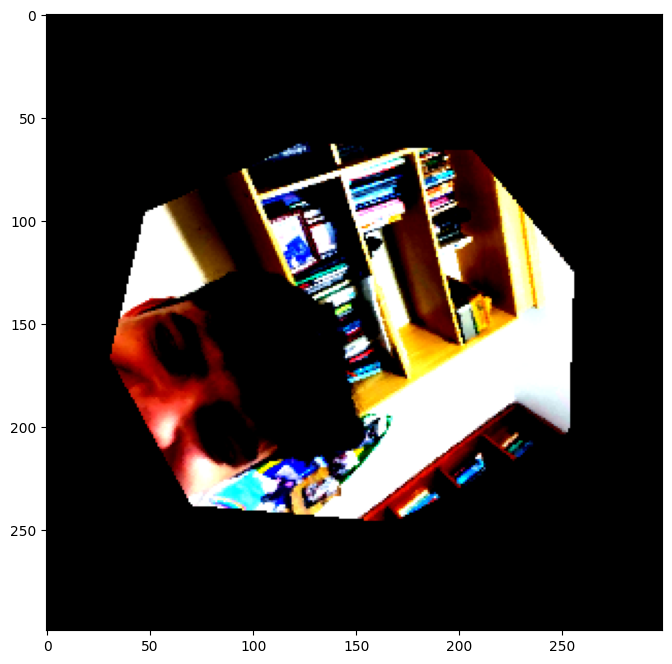

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


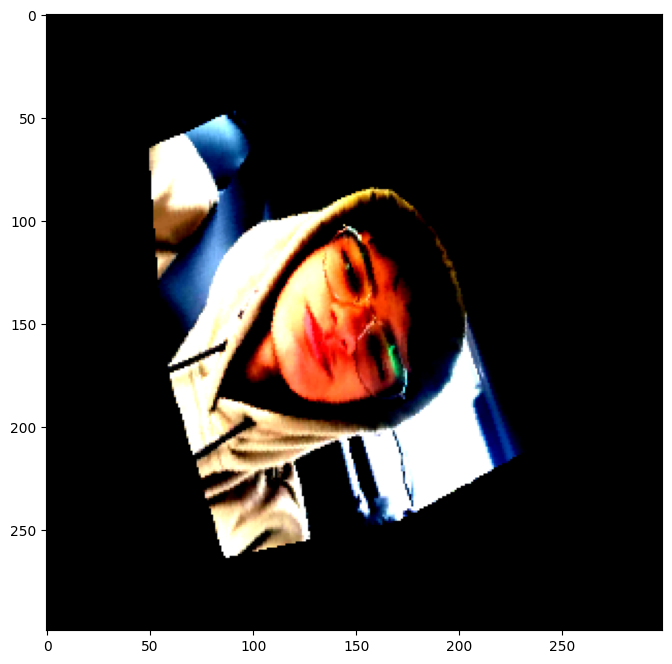

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


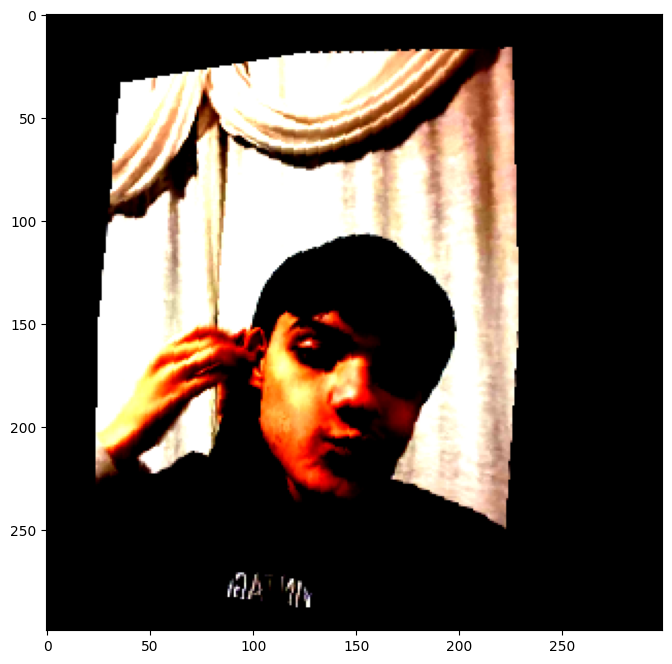

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Carlos


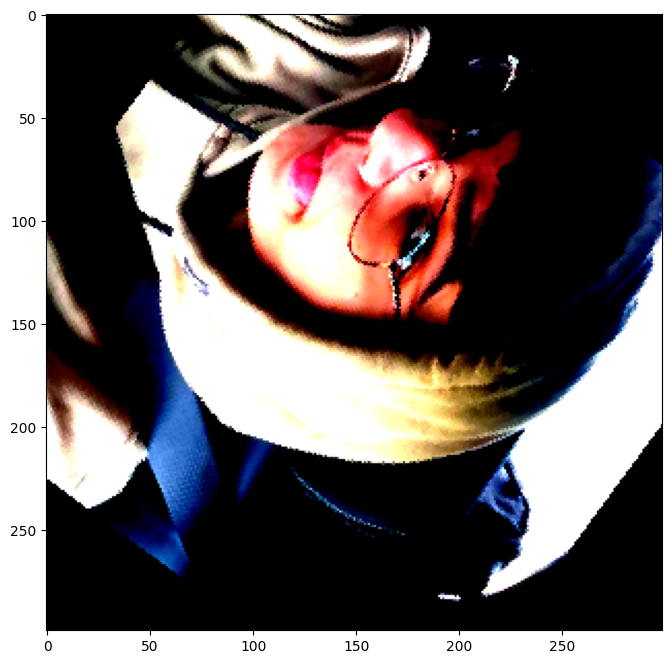

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


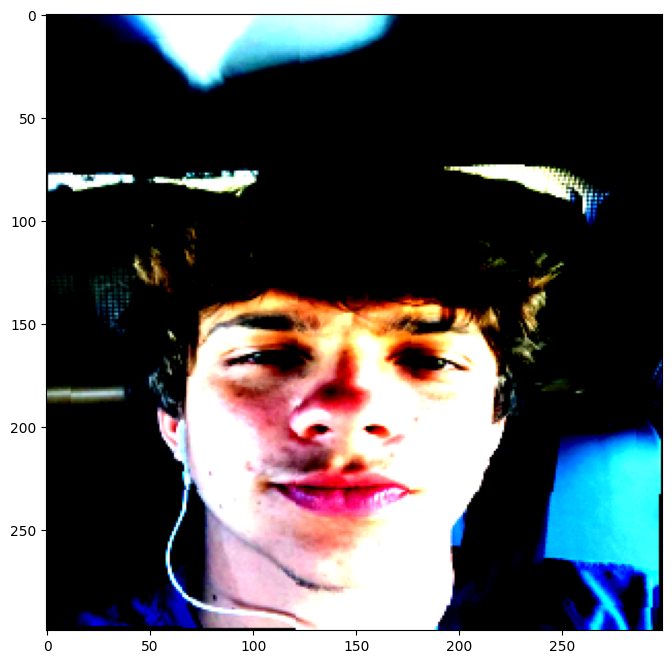

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Urien


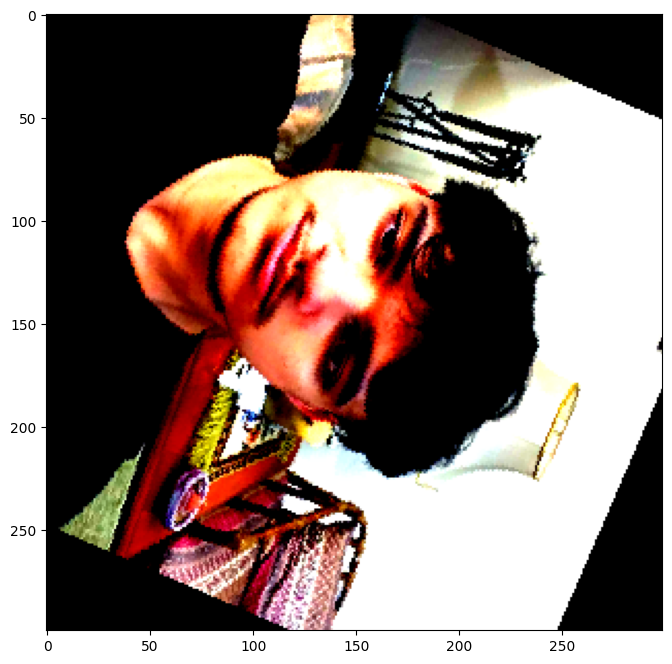

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


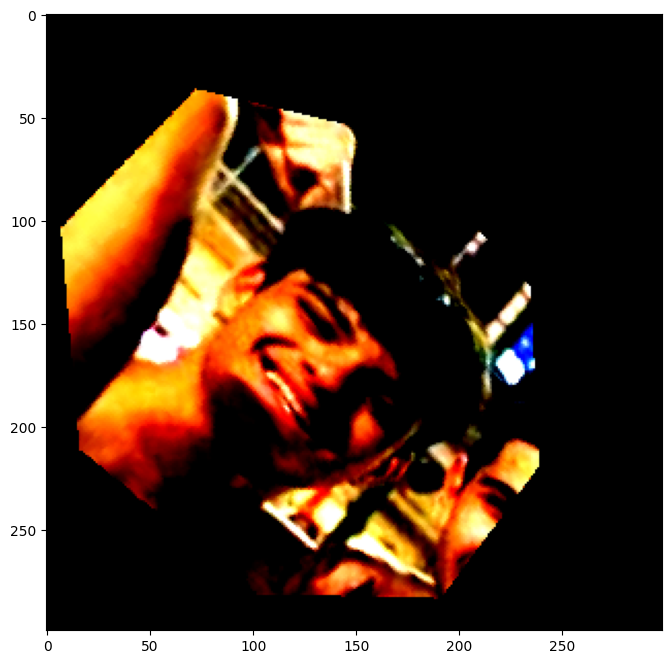

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


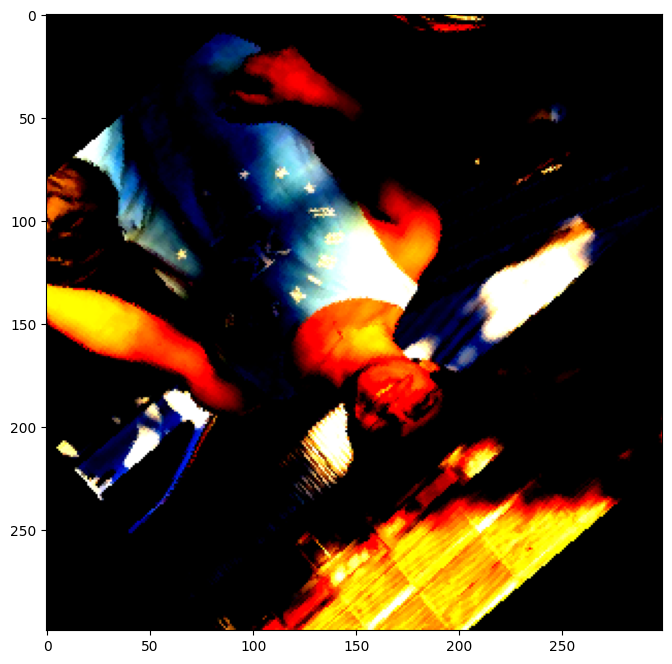

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


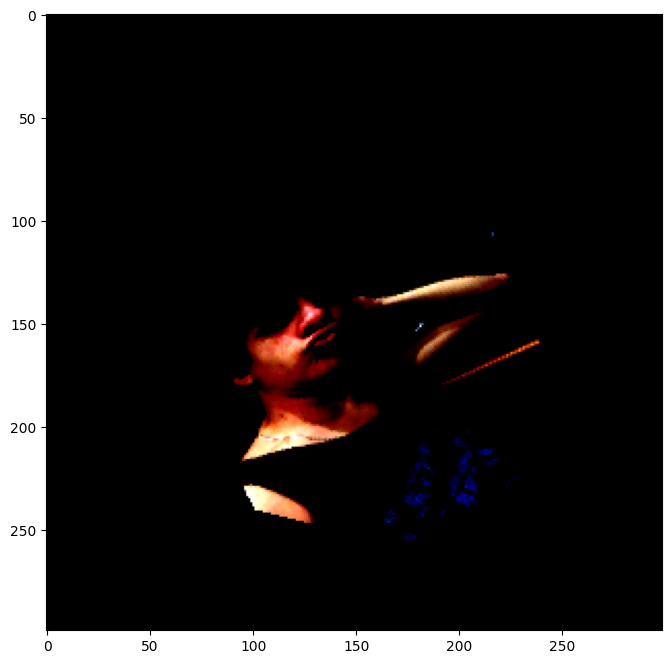

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


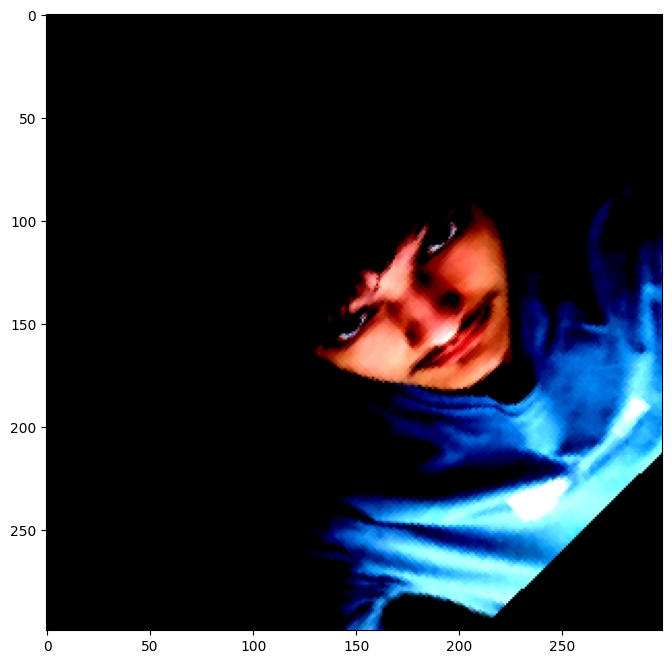

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


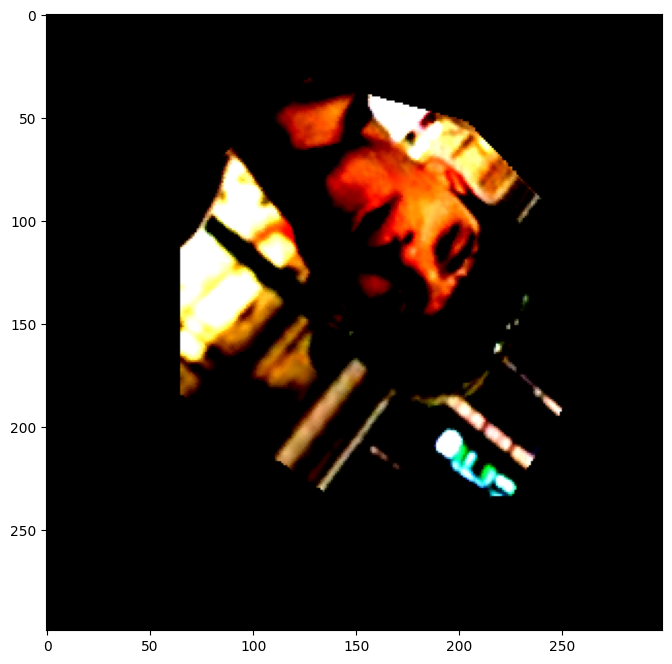

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Carlos


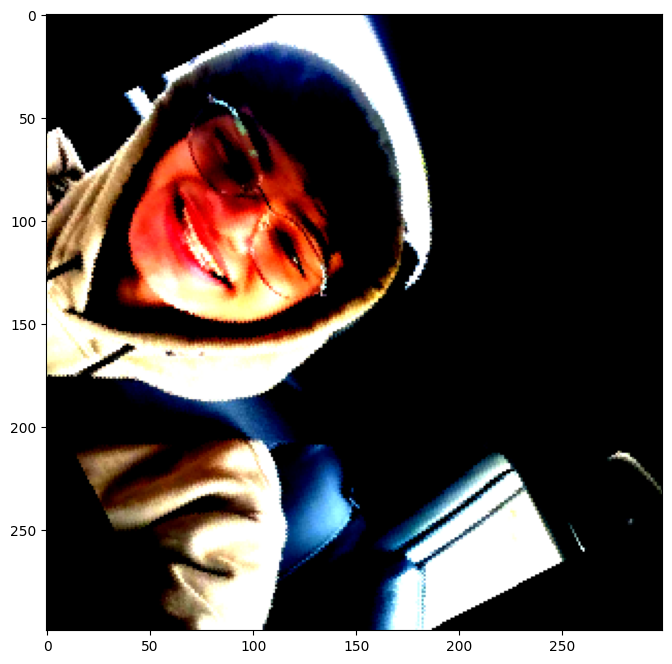

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Carlos
Inception Prediction: Carlos


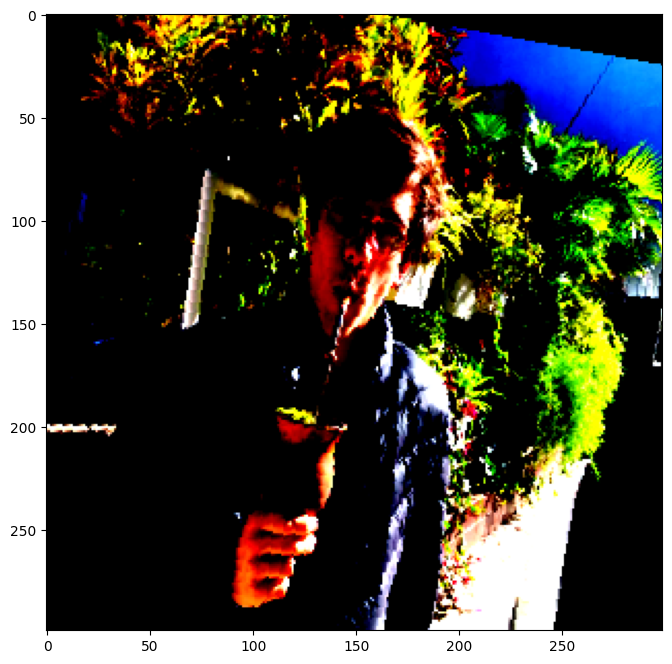

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


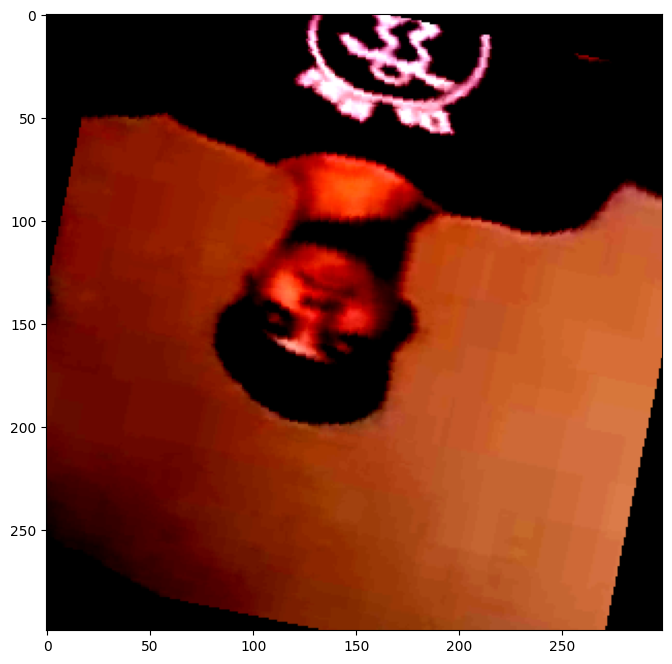

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


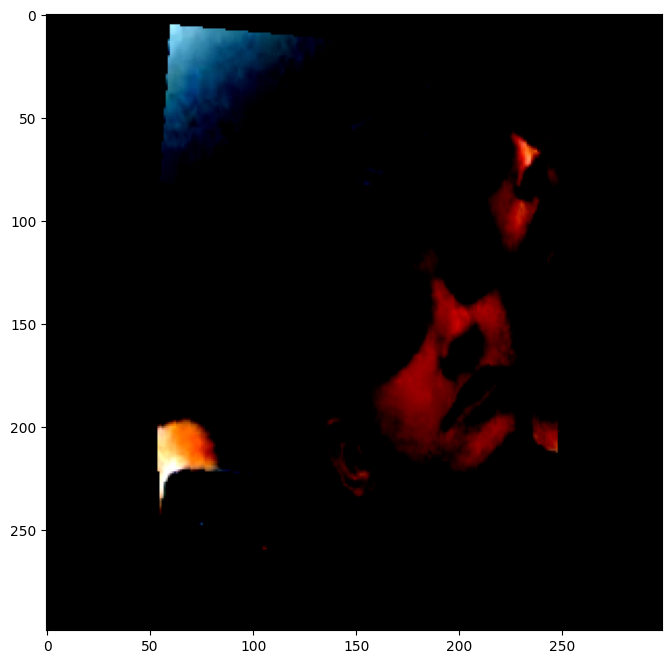

---------------------------------------------------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------------------------------------------------
Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


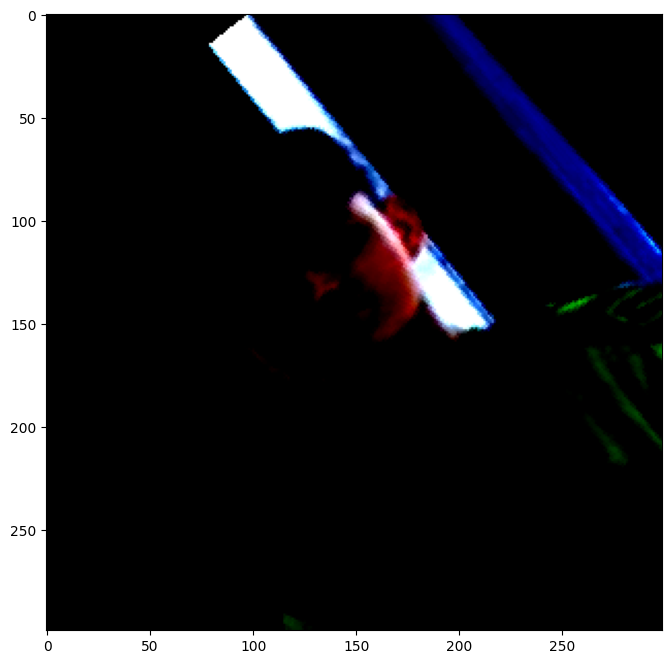

---------------------------------------------------------------------------------------------------------------------------------------------------


In [50]:
for image_index in range(len(test_dataset)):
    image = test_dataset[image_index][0]
    label = 'Urien' if test_dataset[image_index][1] else 'Carlos'
    
    print('---------------------------------------------------------------------------------------------------------------------------------------------------')
    print(f'Real Label: {label}')
    print(f'Resnet Prediction: {predict(resnet, image)}')
    print(f'VGG Prediction: {predict(vgg, image)}')
    print(f'Inception Prediction: {predict(inception, image)}')
    imshow(image)
    print('---------------------------------------------------------------------------------------------------------------------------------------------------')

Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


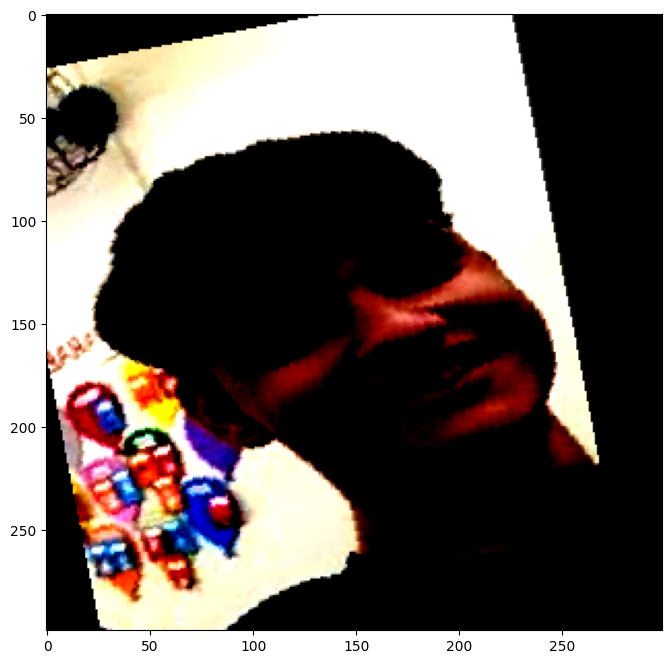

In [51]:
image_index = 3
image = test_dataset[image_index][0]
label = 'Urien' if test_dataset[image_index][1] else 'Carlos'

print(f'Real Label: {label}')
print(f'Resnet Prediction: {predict(resnet, image)}')
print(f'VGG Prediction: {predict(vgg, image)}')
print(f'Inception Prediction: {predict(inception, image)}')
imshow(image)

---

# Testando o modelo


Real Label: Carlos
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


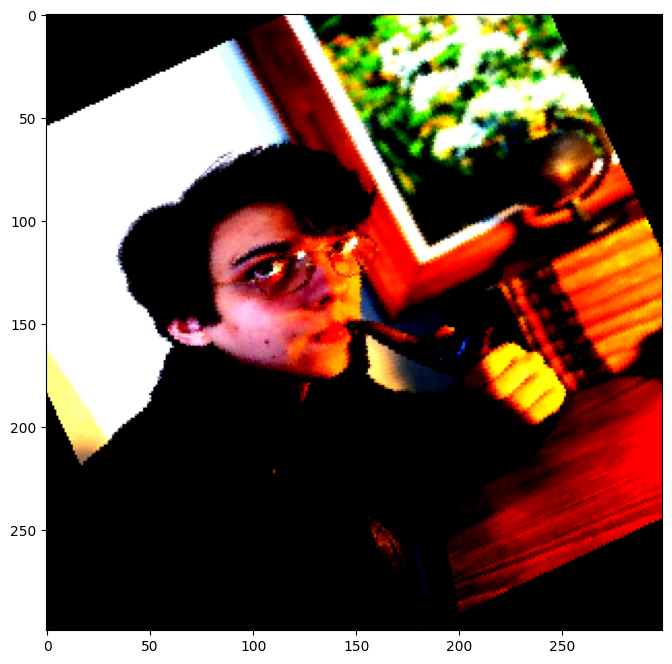

In [52]:
x = Image.open('teste1.jpeg').convert('RGB')
x = transformations(x)
label = 'Carlos'

print(f'Real Label: {label}')
print(f'Resnet Prediction: {predict(resnet, x)}')
print(f'VGG Prediction: {predict(vgg, image)}')
print(f'Inception Prediction: {predict(inception, image)}')

imshow(x)

Real Label: Carlos
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


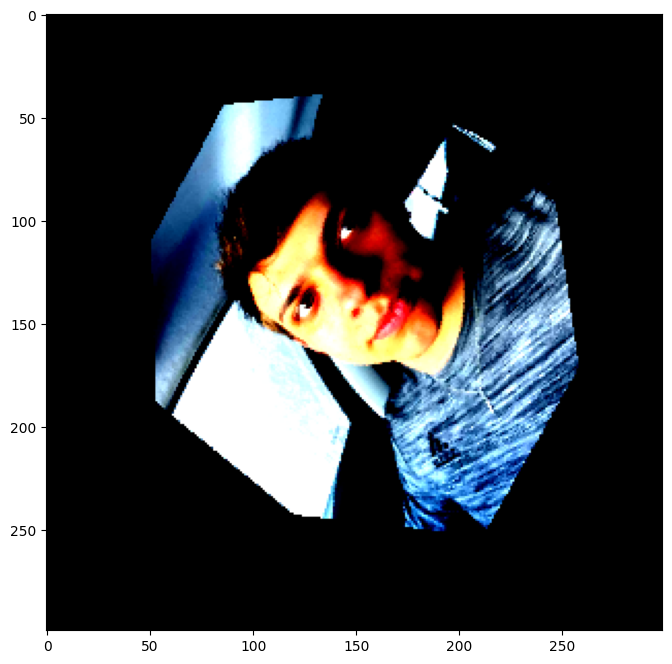

In [53]:
x = Image.open('teste2.jpeg').convert('RGB')
x = transformations(x)
label = 'Carlos'

print(f'Real Label: {label}')
print(f'Resnet Prediction: {predict(resnet, x)}')
print(f'VGG Prediction: {predict(vgg, image)}')
print(f'Inception Prediction: {predict(inception, image)}')

imshow(x)

Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


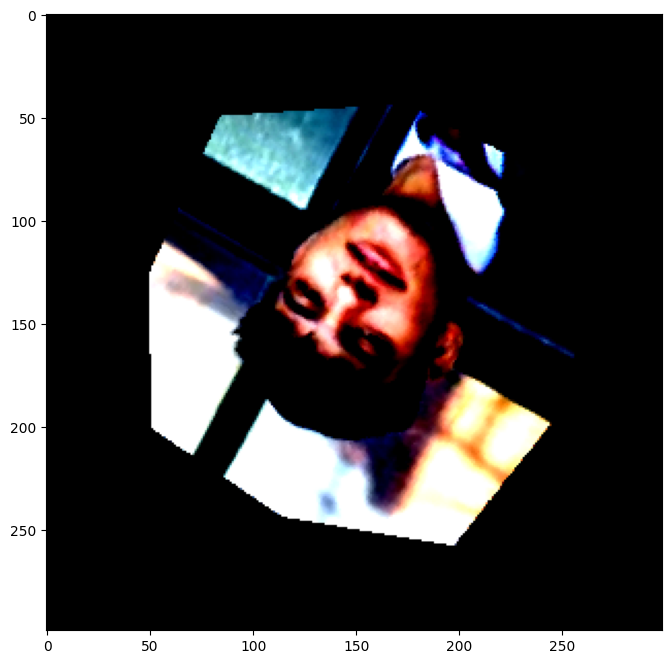

In [54]:
x = Image.open('teste3.png').convert('RGB')
x = transformations(x)
label = 'Urien'

print(f'Real Label: {label}')
print(f'Resnet Prediction: {predict(resnet, x)}')
print(f'VGG Prediction: {predict(vgg, image)}')
print(f'Inception Prediction: {predict(inception, image)}')

imshow(x)

Real Label: Urien
Resnet Prediction: Urien


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


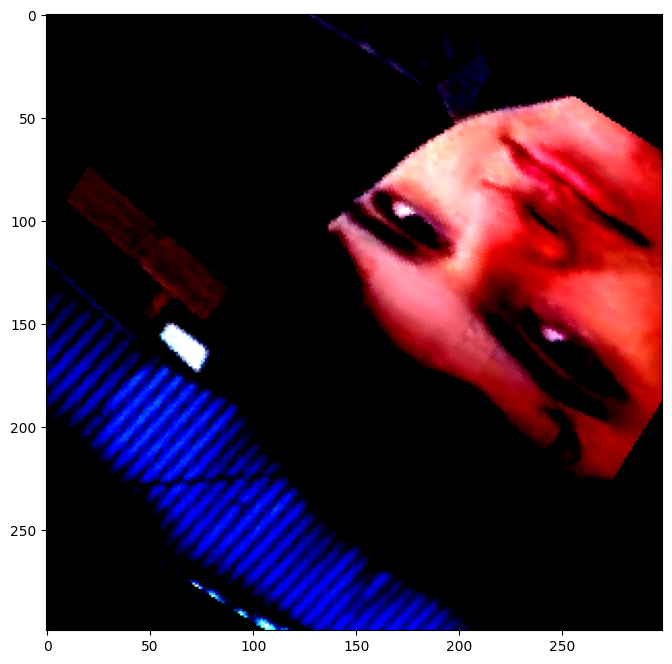

In [55]:
x = Image.open('teste4.png').convert('RGB')
x = transformations(x)
label = 'Urien'

print(f'Real Label: {label}')
print(f'Resnet Prediction: {predict(resnet, x)}')
print(f'VGG Prediction: {predict(vgg, image)}')
print(f'Inception Prediction: {predict(inception, image)}')

imshow(x)

Real Label: Andrei
Resnet Prediction: Carlos


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


VGG Prediction: Urien
Inception Prediction: Urien


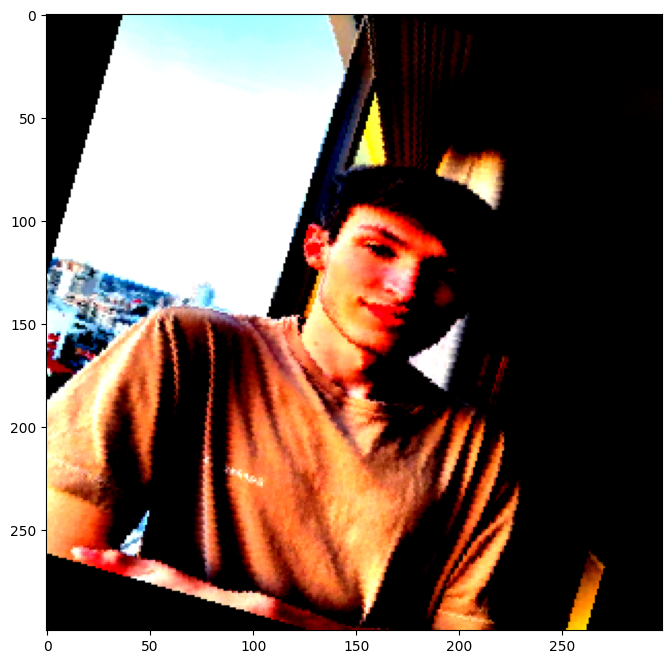

In [58]:
x = Image.open('teste5.jpg').convert('RGB')
x = transformations(x)
label = 'Andrei'

print(f'Real Label: {label}')
print(f'Resnet Prediction: {predict(resnet, x)}')
print(f'VGG Prediction: {predict(vgg, image)}')
print(f'Inception Prediction: {predict(inception, image)}')

imshow(x)